# California Schools Inquiry
By: Martín Mendoza-Ceja  
Project Durtaion: 3/28 - 4/8 (2024)  
Last Updated: 4/8/2024 

## Data Sources:
**Public Schools and Districts:** [Public Schools and Districts](https://www.cde.ca.gov/ds/si/ds/pubschls.asp) (sparsely used in this project)

**(2007-2022)Enrollment:** [Census Day Enrollment by School](https://www.cde.ca.gov/ds/ad/filesenr.asp) 




## Goals
- Make insightful querying functions.
- Make a function that can predict the enrollment for district/school.
- Make a function that can forecast the enrollment for a district/school.
- Use querying functions on some of the top cities in California.

In [674]:
import numpy as np #allows for efficient calculations and manipulation with arrays
import pandas as pd #allows for the use of dataframes and quick insight to the dataset
import matplotlib.pyplot as plt #used with seaborn also allows for object-oriented plotting
import seaborn as sns # allows for visualizations
import regex as re # mainly used for acquiring numbers from strings
import warnings
warnings.filterwarnings('ignore')

## Loading in The Dataets

In [675]:

#the enrollment data sets have to be in the format 'Enrxx-xx.csv' (e.g.'Enr07-08.csv')
files = ['pubschls.xlsx - Public Schools and Districts.csv', 
         'Enr07-08.csv','Enr08-09.csv','Enr09-10.csv','Enr10-11.csv','Enr11-12.csv'
         ,'Enr12-13.csv','Enr13-14.csv','Enr14-15.csv','Enr15-16.csv','Enr16-17.csv','Enr17-18.csv',
         'Enr18-19.csv','Enr19-20.csv','Enr20-21.csv' ,'Enr21-22.csv','Enr22-23.csv']

dfs = []


for file in files:
    df = pd.read_csv(file,low_memory=False)
    dfs.append(df)




## Cleaning the Datasets



### Public Schools and Districts Cleaning

In [676]:


rel_clean_cde = dfs[0].drop(['CDSCode', 'NCESDist', 'NCESSchool','MailStreet',
       'MailStrAbr', 'MailCity', 'MailZip', 'MailState', 'Phone', 'Ext',
       'FaxNumber', 'Email', 'WebSite','EdOpsCode', 'EdOpsName','Magnet','FederalDFCDistrictID', 'Latitude',
       'Longitude','AdmEmail','State','CharterNum','Zip','Street','GSserved','SOC'],axis=1) #remove irrelevant columns


fr_clean_cde = rel_clean_cde[ (rel_clean_cde['SOCType'] != 'No Data') & (rel_clean_cde['EILCode'] != 'No Data') & (rel_clean_cde['EILName'] != 'No Data') ]
pd.set_option('display.max_columns', None)
al_clean_cde = fr_clean_cde.dropna()
reset_cde = al_clean_cde.reset_index()
reset_cde.columns = reset_cde.columns.str.lower()

# replace code values with respective education system

reset_cde['doc'] = [('County Office of Education' if i  == '00' else
                    'State Board of Education' if i  == '02' else
                    'Statewide Benefit Charter' if i  == '03' else
                    'State Special Schools' if i  == '31' else
                    'Non-school Location' if i  == '34' else
                    'Elementary School District' if i  == '52' else
                    'Unified School District' if i  == '54' else
                    'High School District' if i  == '56' else 'Regional Occupation Center') for i in reset_cde['doc']]




la_clean_cde_closed = reset_cde.drop('index',axis=1) #with schools that are open and closed

#dataframe with schools that are still open
la_clean_cde_open = la_clean_cde_closed[la_clean_cde_closed['statustype'] != 'Closed']





### Enrollment Cleaning

**Context:** The year that the school year started is the year the dataframe will be respective to   
(e.g. 2010-2011,  the former year (2010) will be the value for for the `rel_enr_10` dataframe)

In [677]:
def clean_enr(file_name):
    """
    string -> dataframe
    cleans an enrollment dataset
    the enrollment data sets have to be in the format 'Enrxx-xx.csv' (e.g.'Enr07-08.csv')
    """
    enr_raw = dfs[files.index(file_name)].drop(['CDS_CODE','ADULT','UNGR_SEC','UNGR_ELM'],axis=1) #remove irrelevant columns
    enr_raw.columns = enr_raw.columns.str.lower()
    enr_raw['ethnic'] = [('American Indian or Alaska Native' if i == 1 
                      else 'Asian' if i == 2 
                      else 'Pacific Islander' if i == 3 
                      else 'Filipino' if i == 4 
                      else 'Hispanic or Latino' if i == 5 
                      else 'African American' if i == 6 
                      else 'White' if i == 7 
                      else 'Mixed' if i == 9 
                      else 'Not Reported') for i in enr_raw['ethnic']] # replace code value with respective race

    enr_raw['gender'] = [('Female' if i == 'F' 
                     else 'Male' if i == 'M'
                     else 'Non-Binary' if i == 'X'
                     else 'Missing') for i in enr_raw['gender']]  # replace code value with respective gender
    rel_enr = enr_raw
    rel_enr['year'] = int(re.findall('\d+',file_name)[0]) + 2000 #will as long as file_name is correctly formatted
    return rel_enr


In [678]:
#store the cleaned data frames in this variable an then put each data frame in a variable
enr_years_cleaned = [clean_enr(i) for i in files[1:]]
rel_enr_07 = enr_years_cleaned[0]
rel_enr_08 = enr_years_cleaned[1]
rel_enr_09 = enr_years_cleaned[2]
rel_enr_10 = enr_years_cleaned[3]
rel_enr_11 = enr_years_cleaned[4]
rel_enr_12 = enr_years_cleaned[5]
rel_enr_13 = enr_years_cleaned[6]
rel_enr_14 = enr_years_cleaned[7]
rel_enr_15 = enr_years_cleaned[8]
rel_enr_16 = enr_years_cleaned[9]
rel_enr_17 = enr_years_cleaned[10]
rel_enr_18 = enr_years_cleaned[11]
rel_enr_19 = enr_years_cleaned[12]
rel_enr_20 = enr_years_cleaned[13]
rel_enr_21 = enr_years_cleaned[14]
rel_enr_22 = enr_years_cleaned[15] 

In [679]:
#store each enrollment dataset for each year 
enr_years =  [rel_enr_07,rel_enr_08,rel_enr_09,rel_enr_10,rel_enr_11,rel_enr_12,
              rel_enr_13,rel_enr_14,rel_enr_15,rel_enr_16,rel_enr_17,rel_enr_18,
              rel_enr_19,rel_enr_20,rel_enr_21,rel_enr_22]


## Querying Functions
The funtions below are mainly helper functions used later the in the functions that output plots

#### parameter/functions labeling context:
- `distr` = distribution
- `edu` = school or district
- `is_district` by default is set to True meaning that `edu` expects a district name, in the case of when querying for a school `is_district` should be set False in the function call, `is_district=False`

In [680]:
#store the relevent years
recent_year = 2023 #change the value of this to the most recent year 
#(i.e. 2023 is recent because 2022-2023 was the last shcool year with published data)
years = np.arange(2007,recent_year)


In [681]:

def join_gen_enr(df,district):
    """
    dataframe string -> dataframe
    join The public schools and districts dataset and an enrollment dataset, on a shared district
    """
    
    df_enr = df[df['district'] == district]
    df_gen = la_clean_cde_open[la_clean_cde_open['district'] == district]

    enr_gen_df = df_enr.merge(df_gen,how='inner')
    enr_gen_df['school_type'] = ['Middle School' if i == 'Intermediate/Middle/Junior High' else i  for i in enr_gen_df['eilname']]
    return enr_gen_df



In [682]:

def search(df,edu,is_district=True):
    """"
    dataframe string is_district=boolean -> tuple
    search to see if an edu is in a desired school year
    """
    
    #these list conatin the edu that user may be looking for
    district_list = pd.unique(df.loc[df.district.str.contains(edu)].district)
    school_list = pd.unique(df.loc[df.school.str.contains(edu)].school)
    if is_district:
        filtered_series = df.loc[df.district == edu].district
    else:
        filtered_series = df.loc[df.school == edu].school
    if not filtered_series.empty: #check if the series is empty
        return 'True, '+filtered_series.iloc[0]+" is in this dataset"
    else:
        if is_district: #if edu is not found this eill output a list with the possible edu
            return 'False, '+edu+' is not in this dataset, this list may have what your looking for: ', list(district_list)
        else:
            return 'False, '+edu+' is not in this dataset, this list may have what your looking for: ', list(school_list)
    
    
 
        


In [683]:

def get_enr_total(df,edu,is_district=True):
    """
    dataframe string is_district=boolean -> string
    get the total enrollment for an edu in a desired school year
    
    """
    
    if is_district:
        spec_edu = df.loc[df['district'] == edu]
    else:
        spec_edu = df.loc[df.school == edu]
    
    return 'There was '+str(np.sum(spec_edu['enr_total'])) + ' students enrolled in '+edu+' ('+str(df.year[0])+'-'+str(df.year[0]+1)+')'
    
    


In [684]:

def gender_counts(df):
    """
    dataframe -> dataframe
    expects a dataframe with the desired school year and a dataframe
    containing the districts in that school year and the total count of male and female for each district
    (takes a while to load)
    """
    distr_gen_count = pd.DataFrame({'district':pd.unique(df.district)})
    distr_gen_count['female_count'] = [female_gender_counts_dist(df,i) for i in distr_gen_count.district]
    distr_gen_count['male_count'] = [male_gender_counts_dist(df,i) for i in distr_gen_count.district]
                  
    return distr_gen_count


In [685]:


def male_gender_counts(df,edu,is_district=True):
    """
    dataframe string is_district=boolean -> int
    function to get the count of a males in the given edu
    
    """
    
    
    if is_district: 
        male_counts = df.loc[(df['gender'] == 'Male') & (df['district'] == edu)]
        male_total = male_counts['enr_total'].sum()
    else:
        male_counts = df.loc[(df['gender'] == 'Male') & (df['school'] == edu)]
        male_total = male_counts['enr_total'].sum()
    return male_total


def female_gender_counts(df,edu,is_district=True):
    """
    dataframe string is_district=boolean -> int
    function to get the count of a females in the given edu
    
    """
    if is_district: 
        female_counts = df.loc[(df['gender'] == 'Female') & (df['district'] == edu)]
        female_total = female_counts['enr_total'].sum()
    else:
        female_counts = df.loc[(df['gender'] == 'Female') & (df['school'] == edu)]
        female_total = female_counts['enr_total'].sum()
    return female_total


def non_binary_counts(df,edu,is_district=True):
    """
    dataframe string is_district=boolean -> int
    function to get the count of a non-binary individuals in the given edu
    
    """
    if is_district and df.year[0] > 2018:
        non_binary_counts = df.loc[(df['gender'] == 'Non-Binary') & (df['district'] == edu)]
        non_binary_total = non_binary_counts['enr_total'].sum()
    else: 
        non_binary_counts = df.loc[(df['gender'] == 'Non-Binary') & (df['school'] == edu)]
        non_binary_total = non_binary_counts['enr_total'].sum()
    return non_binary_total



In [686]:

def enr_school_year(df):
    """
    dataframe -> dataframe
    get total enrollment for all schools in a desired school year
    """
    group_edu = df.groupby(['school']).sum()
    df = pd.DataFrame({'enr_total':group_edu['enr_total'],'year':df.year[0]}).reset_index()
    return df



In [687]:

def enr_per_school(df,district_name):

    """
    DataFrame string -> DataFrame
    outputs a data frame with the total enrollment for each school in the given district 
    in the desired school year.

    """
    school_enrollment = join_gen_enr(df,district_name).groupby('school')['enr_total'].sum().reset_index()
    per_total_enr = pd.merge(join_gen_enr(df,district_name), school_enrollment, on='school', suffixes=('', '_total'))

    # Rename the newly added column to indicate it's the total enrollment per school
    per_total_enr.rename(columns={'enr_total_total': 'total_enrollment_per_school'}, inplace=True)
    per_school_enr = per_total_enr[['year','county','district','school','school_type','total_enrollment_per_school']] #add columns from the initial datasets when relevant here
    per_school_enr.loc[per_school_enr['district'] == district_name]

    # condense the data
    condensed_df = per_school_enr.groupby(['county', 'district', 'school','school_type']).min().reset_index()
    return condensed_df



In [688]:

def total_enrl_yearly(edu,is_district=True):
    """
    string is_district=boolean -> dataframe
    total enrollment for each year for the given school
    expects an edu and returns the total enrollemnt for each year for the given edu in dataframe
    """
    if is_district:
        enrl_total = pd.DataFrame({'year':years})
        enrl_total['total_enrl'] = [enr_per_school(i,edu).total_enrollment_per_school.sum() for i in enr_years]
        
    else:
        enrl_total = pd.DataFrame({'year':years})
        enrl_total['total_enrl'] = [list(enr_school_year(i).loc[enr_school_year(i).school == edu ].enr_total)[0] 
                                      if  len(enr_school_year(i).loc[enr_school_year(i).school == edu ].enr_total) > 0 
                                      else None # some school dont have data in certain years this code accounts for those cases
                                      for i in enr_years]
        enrl_total = enrl_total.fillna(0)
    return enrl_total

total_enrl_yearly('Lincoln (Abraham) High',is_district=False).head() #example call and output


,year,total_enrl
0,2007,0.0
1,2008,0.0
2,2009,0.0
3,2010,0.0
4,2011,2020.0


## Querying Functions that Output Plots
These functions can be best for getting the quick insights. I recommend using the  `search` function when starting your query to check if the EDU you are looking for is present. Also, I recommend using `total_enr_dist` to get an idea of the top schools in the district you are interested in.

### Trend for Enrollment in an EDU (2007-2023)

In [689]:

def trend_enroll(edu,is_district=True):
    """
    string is_district=boolean -> plot
    expects an edu and returns a line plot of the trend in total enrollment given edu
    """
    #manipulate the data into a data frame for the line plot
    if is_district:
        plt.figure(figsize=(15,10))
        total_enr_yearly = [np.sum(enr_per_school(i,edu)).total_enrollment_per_school for i in enr_years]
        years_total = pd.DataFrame({'year':years,'yearly_total_enrollment':total_enr_yearly})
        sns.lineplot(data=years_total,x='year',y='yearly_total_enrollment') 
        plt.title('Enrollment Trend, '+ edu) 
        plt.xlabel('Year') 
        plt.ylabel('Total Enrollment') 
        plt.ylim(0)
        plt.show()
    else:
        plt.figure(figsize=(15,10))
        years_total = total_enrl_yearly(edu,is_district=False)
        sns.lineplot(data=years_total,x='year',y='total_enrl') 
        plt.title('Enrollment Trend, '+ edu) 
        plt.xlabel('Year') 
        plt.ylabel('Total Enrollment') 
        plt.ylim(0)
        plt.show() 
    


### Trend for Enrollment Between two edu's(2007-2023)

In [690]:

def trend_two_edu(edu1,edu2,is_district=True):
    """
    string string is_district=boolean -> plot
    expects two districts or schools(has to be two of each can't be a district and school)  
    and returns a line plot of the trend in total enrollment for the given edu's
    """
    if is_district:
        
        year_school_data = {'year':years,
                        edu1:total_enrl_yearly(edu1).total_enrl,
                        edu2:total_enrl_yearly(edu2).total_enrl}
        years_total = pd.DataFrame(year_school_data)
        plt.figure(figsize=(20,10))
        sns.lineplot(data=years_total,x='year',y=edu1,label=edu1) 
        sns.lineplot(data=years_total,x='year',y=edu2,label=edu2) 
        plt.title('Enrollment Trend Between '+ edu1+' and '+edu2) 
        plt.xlabel('Year') 
        plt.ylabel('Total Enrollment') 
        plt.legend(fontsize="large")
        plt.ylim(0)
        plt.show()
    else:
        
        total_enr_edu1 = total_enrl_yearly(edu1,is_district=False).total_enrl
        total_enr_edu2 = total_enrl_yearly(edu2,is_district=False).total_enrl
   
        years_total_raw = pd.DataFrame({'year':years,
                                edu1:total_enr_edu1,
                                edu2:total_enr_edu2})
        years_total = pd.DataFrame(years_total_raw)
        plt.figure(figsize=(20,10))
        sns.lineplot(data=years_total,x='year',y=edu1,label=edu1) 
        sns.lineplot(data=years_total,x='year',y=edu2,label=edu2) 
        plt.title('Enrollment Trend Between '+ edu1+' and '+edu2) 
        plt.xlabel('Year') 
        plt.ylabel('Total Enrollment') 
        plt.legend(fontsize='large')
        plt.ylim(0)
        plt.show() 



### Bar Plot of Total Enrollment for Each School in a District in school year

In [691]:

def total_enr_dist(df,district,amount=10):
    
    """
    dataframe string amount=int -> plot
    expects a dataframe with the desired school year and returns a a barplot 
    of the count of total enrollment in the given district.
    has an optional argument `amount=` which by defualt selects the top 10 schools in the given district
    call this parameter with a your desired amount if you wish to see specific amount of schools
    """

    df_ready = enr_per_school(df,district).sort_values(by='total_enrollment_per_school',ascending=False).reset_index().iloc[:amount]
    df_year = df_ready.year[0]
    plt.figure(figsize=(15,15)) 
    sns.barplot(data=df_ready,y='school',x='total_enrollment_per_school') 
    plt.title('Total Enrollment per School in '+district+' ('+str(df_year)+'-'+str(df_year+1)+')',fontdict={'fontsize': 36}) 
    plt.xlabel('Total Count of Enrollemnt',fontdict={'fontsize': 20}) 
    plt.ylabel('School',fontdict={'fontsize': 20}) 
    plt.show()



## Distributions of Gender/Ethnicity in a District/School

#### Gender Distributions

In [692]:

def gender_stat(df,edu,is_district=True):
    """
    dataframe string is_district=boolean -> string plot
    expects a dataframe with a desired school year and returns a a barplot 
    of the count of each gender in a the given edu and a statistical statement
    
    """
    
    if is_district:
        #account for non-binary
        if df.year[0] > 2018:
            counts = {'gender':['male','female','non-binary'],
                  'gender_counts':[male_gender_counts(df,edu),female_gender_counts(df,edu),non_binary_counts(df,edu)]}
            counts_df = pd.DataFrame(counts)
            df_year = df.year[0]
            sns.barplot(data=counts_df,x='gender',y='gender_counts') 
            plt.title(edu+' Gender Demographic '+'('+str(df_year)+'-'+str(df_year+1)+')') 
            plt.ylabel('count')
            plt.show()
            stat_male = counts_df.gender_counts[0]/counts_df.gender_counts.sum()
            stat_female = counts_df.gender_counts[1]/counts_df.gender_counts.sum()
            stat_nb = counts_df.gender_counts[2]/counts_df.gender_counts.sum()                                                                                                                                                                                      #get number from the string that this function outputs
            statement = "At " + edu + ", males make up " + str(int(round(stat_male, 2) * 100)) + "% and females make up " + str(int(round(stat_female, 2) * 100)) +  "% and non-binary students make up " + str(int(round(stat_nb, 2) * 100)) +"% with a total of " + re.findall("\d+",get_enr_total(df,edu))[0] + " students in "+str(df_year)+'-'+str(df_year+1)
            return statement
        else:
            counts = {'gender':['male','female'],
                  'gender_counts':[male_gender_counts(df,edu),female_gender_counts(df,edu)]}
            counts_df = pd.DataFrame(counts)
            df_year = df.year[0]
            sns.barplot(data=counts_df,x='gender',y='gender_counts') 
            plt.title(edu+' Gender Demographic '+'('+str(df_year)+'-'+str(df_year+1)+')') 
            plt.ylabel('count')
            plt.show()
        
            stat_male = counts_df.gender_counts[0]/counts_df.gender_counts.sum()
            stat_female = counts_df.gender_counts[1]/counts_df.gender_counts.sum() 
            statement = "At " + edu + ", males make up " + str(int(round(stat_male, 2) * 100)) + "% and females make up " + str(int(round(stat_female, 2) * 100)) + "% with a total of " + re.findall("\d+",get_enr_total(df,edu))[0] + " students in "+str(df_year)+'-'+str(df_year+1)

            return statement
    else:
        #account for non-binary
        if df.year[0] > 2018:
            counts = {'gender':['male','female','non-binary'],
                  'gender_counts':[male_gender_counts(df,edu,is_district=False),female_gender_counts(df,edu,is_district=False),non_binary_counts(df,edu,is_district=False)]}
            counts_df = pd.DataFrame(counts)
            df_year = df.year[0]
            sns.barplot(data=counts_df,x='gender',y='gender_counts') 
            plt.title(edu+' Gender Demographic '+'('+str(df_year)+'-'+str(df_year+1)+')')
            plt.ylabel('count')
            plt.show()
            stat_male = counts_df.gender_counts[0]/counts_df.gender_counts.sum()
            stat_female = counts_df.gender_counts[1]/counts_df.gender_counts.sum()
            stat_nb = counts_df.gender_counts[2]/counts_df.gender_counts.sum()
            statement = "At " + edu + ", males make up " + str(int(round(stat_male, 2) * 100)) + "% and females make up " + str(int(round(stat_female, 2) * 100)) +  "% and non-binary students make up " + str(int(round(stat_nb, 2) * 100)) +"% with a total of " + str(get_enr_total(df,edu,is_district=False)) + " students in "+str(df_year)+'-'+str(df_year+1)
            return statement
        else:
            counts = {'gender':['male','female'],
                  'gender_counts':[male_gender_counts(df,edu,is_district=False),female_gender_counts(df,edu,is_district=False)]}
            counts_df = pd.DataFrame(counts)
            df_year = df.year[0]
            sns.barplot(data=counts_df,x='gender',y='gender_counts') 
            plt.title(edu+' Gender Demographic '+'('+str(df_year)+'-'+str(df_year+1)+')')
            plt.ylabel('count')
            plt.show()
        
            stat_male = counts_df.gender_counts[0]/counts_df.gender_counts.sum()
            stat_female = counts_df.gender_counts[1]/counts_df.gender_counts.sum() 
            statement = "At " + edu + ", males make up " + str(int(round(stat_male, 2) * 100)) + "% and females make up " + str(int(round(stat_female, 2) * 100)) + "% with a total of " + re.findall("\d+",get_enr_total(df,edu,is_district=False))[0] + " students in "+str(df_year)+'-'+str(df_year+1)

            return statement
    
        


In [693]:

def gender_distr(df,edu,is_district=True):
    """
    dataframe string is_district=boolean -> plot
    expects a dataframe with a desired school year and returns a distribution of gender in that school year 
    for the given edu
    """
    if is_district:
        df_district = df.loc[df['district'] == edu ]
        df_year = df.year[0]
        plt.figure(figsize=(8,6)) 
        sns.kdeplot(data=df_district,x='enr_total',hue='gender',fill=True) 
        plt.title('Distribution of Gender in '+edu+' ('+str(df_year)+'-'+str(df_year+1)+')') 
        plt.xlabel('Enrollment') 
        plt.show() 
    else:
        df_edu = df.loc[df['school'] == edu ]
        df_year = df.year[0]
        plt.figure(figsize=(8,6)) 
        sns.kdeplot(data=df_edu,x='enr_total',hue='gender',fill=True) 
        plt.title('Distribution of Gender in '+edu+' ('+str(df_year)+'-'+str(df_year+1)+')') 
        plt.xlabel('Enrollment') 
        plt.show()
        



#### Gender Distributions Faceted

In [694]:

def gender_distr_edu_facet(edu,is_district=True):
    """
    string is_district=boolean ->  subplots(16)
    returns the distributions of gender for each year for the given edu
    """
    if is_district:
        fig,ax = plt.subplots(4, 4, figsize = (20, 20))
    
        ax_00 = sns.kdeplot(data=rel_enr_07.loc[rel_enr_07['district'] == edu],x='enr_total',hue='gender',fill=True,ax= ax[0][0],warn_singular=False)
        ax_01 = sns.kdeplot(data=rel_enr_08.loc[rel_enr_08['district'] == edu],x='enr_total',hue='gender',fill=True,ax= ax[0][1],warn_singular=False)
        ax_02 = sns.kdeplot(data=rel_enr_09.loc[rel_enr_09['district'] == edu],x='enr_total',hue='gender',fill=True,ax= ax[0][2],warn_singular=False)
        ax_03 = sns.kdeplot(data=rel_enr_10.loc[rel_enr_10['district'] == edu],x='enr_total',hue='gender',fill=True,ax= ax[0][3],warn_singular=False)
        ax_04 = sns.kdeplot(data=rel_enr_11.loc[rel_enr_11['district'] == edu],x='enr_total',hue='gender',fill=True,ax= ax[1][0],warn_singular=False)
        ax_10 = sns.kdeplot(data=rel_enr_12.loc[rel_enr_12['district'] == edu] ,x='enr_total',hue='gender',fill=True,ax= ax[1][1],warn_singular=False)
        ax_11 = sns.kdeplot(data=rel_enr_13.loc[rel_enr_13['district'] == edu] ,x='enr_total',hue='gender',fill=True,ax= ax[1][2],warn_singular=False)
        ax_12 = sns.kdeplot(data=rel_enr_14.loc[rel_enr_14['district'] == edu] ,x='enr_total',hue='gender',fill=True,ax= ax[1][3],warn_singular=False)
        ax_13 = sns.kdeplot(data=rel_enr_15.loc[rel_enr_15['district'] == edu] ,x='enr_total',hue='gender',fill=True,ax= ax[2][0],warn_singular=False)
        ax_14 = sns.kdeplot(data=rel_enr_16.loc[rel_enr_16['district'] == edu] ,x='enr_total',hue='gender',fill=True,ax= ax[2][1],warn_singular=False)
        ax_20 = sns.kdeplot(data=rel_enr_17.loc[rel_enr_17['district'] == edu] ,x='enr_total',hue='gender',fill=True,ax= ax[2][2],warn_singular=False)
        ax_21 = sns.kdeplot(data=rel_enr_18.loc[rel_enr_18['district'] == edu] ,x='enr_total',hue='gender',fill=True,ax= ax[2][3],warn_singular=False)
        ax_22 = sns.kdeplot(data=rel_enr_19.loc[rel_enr_19['district'] == edu] ,x='enr_total',hue='gender',fill=True,ax= ax[3][0],warn_singular=False)
        ax_23 = sns.kdeplot(data=rel_enr_20.loc[rel_enr_20['district'] == edu] ,x='enr_total',hue='gender',fill=True,ax= ax[3][1],warn_singular=False)
        ax_24 = sns.kdeplot(data=rel_enr_21.loc[rel_enr_21['district'] == edu] ,x='enr_total',hue='gender',fill=True,ax= ax[3][2],warn_singular=False)
        ax_30 = sns.kdeplot(data=rel_enr_22.loc[rel_enr_22['district'] == edu] ,x='enr_total',hue='gender',fill=True,ax= ax[3][3],warn_singular=False)

        ax_00.title.set_text('2007')
        ax_01.title.set_text('2008')
        ax_02.title.set_text('2009')
        ax_03.title.set_text('2010')
        ax_04.title.set_text('2011')
        ax_10.title.set_text('2012')
        ax_11.title.set_text('2013')
        ax_12.title.set_text('2014')
        ax_13.title.set_text('2015')
        ax_14.title.set_text('2016')
        ax_20.title.set_text('2017')
        ax_21.title.set_text('2018')
        ax_22.title.set_text('2019')
        ax_23.title.set_text('2020')
        ax_24.title.set_text('2021')
        ax_30.title.set_text('2022')
        plt.tight_layout() 
    else:
        fig,ax = plt.subplots(4, 4, figsize = (20, 20))
    
        ax_00 = sns.kdeplot(data=rel_enr_07.loc[rel_enr_07['school'] == edu],x='enr_total',hue='gender',fill=True,ax= ax[0][0],warn_singular=False)
        ax_01 = sns.kdeplot(data=rel_enr_08.loc[rel_enr_08['school'] == edu],x='enr_total',hue='gender',fill=True,ax= ax[0][1],warn_singular=False)
        ax_02 = sns.kdeplot(data=rel_enr_09.loc[rel_enr_09['school'] == edu],x='enr_total',hue='gender',fill=True,ax= ax[0][2],warn_singular=False)
        ax_03 = sns.kdeplot(data=rel_enr_10.loc[rel_enr_10['school'] == edu],x='enr_total',hue='gender',fill=True,ax= ax[0][3],warn_singular=False)
        ax_04 = sns.kdeplot(data=rel_enr_11.loc[rel_enr_11['school'] == edu],x='enr_total',hue='gender',fill=True,ax= ax[1][0],warn_singular=False)
        ax_10 = sns.kdeplot(data=rel_enr_12.loc[rel_enr_12['school'] == edu] ,x='enr_total',hue='gender',fill=True,ax= ax[1][1],warn_singular=False)
        ax_11 = sns.kdeplot(data=rel_enr_13.loc[rel_enr_13['school'] == edu] ,x='enr_total',hue='gender',fill=True,ax= ax[1][2],warn_singular=False)
        ax_12 = sns.kdeplot(data=rel_enr_14.loc[rel_enr_14['school'] == edu] ,x='enr_total',hue='gender',fill=True,ax= ax[1][3],warn_singular=False)
        ax_13 = sns.kdeplot(data=rel_enr_15.loc[rel_enr_15['school'] == edu] ,x='enr_total',hue='gender',fill=True,ax= ax[2][0],warn_singular=False)
        ax_14 = sns.kdeplot(data=rel_enr_16.loc[rel_enr_16['school'] == edu] ,x='enr_total',hue='gender',fill=True,ax= ax[2][1],warn_singular=False)
        ax_20 = sns.kdeplot(data=rel_enr_17.loc[rel_enr_17['school'] == edu] ,x='enr_total',hue='gender',fill=True,ax= ax[2][2],warn_singular=False)
        ax_21 = sns.kdeplot(data=rel_enr_18.loc[rel_enr_18['school'] == edu] ,x='enr_total',hue='gender',fill=True,ax= ax[2][3],warn_singular=False)
        ax_22 = sns.kdeplot(data=rel_enr_19.loc[rel_enr_19['school'] == edu] ,x='enr_total',hue='gender',fill=True,ax= ax[3][0],warn_singular=False)
        ax_23 = sns.kdeplot(data=rel_enr_20.loc[rel_enr_20['school'] == edu] ,x='enr_total',hue='gender',fill=True,ax= ax[3][1],warn_singular=False)
        ax_24 = sns.kdeplot(data=rel_enr_21.loc[rel_enr_21['school'] == edu] ,x='enr_total',hue='gender',fill=True,ax= ax[3][2],warn_singular=False)
        ax_30 = sns.kdeplot(data=rel_enr_22.loc[rel_enr_22['school'] == edu] ,x='enr_total',hue='gender',fill=True,ax= ax[3][3],warn_singular=False)

        ax_00.title.set_text('2007')
        ax_01.title.set_text('2008')
        ax_02.title.set_text('2009')
        ax_03.title.set_text('2010')
        ax_04.title.set_text('2011')
        ax_10.title.set_text('2012')
        ax_11.title.set_text('2013')
        ax_12.title.set_text('2014')
        ax_13.title.set_text('2015')
        ax_14.title.set_text('2016')
        ax_20.title.set_text('2017')
        ax_21.title.set_text('2018')
        ax_22.title.set_text('2019')
        ax_23.title.set_text('2020')
        ax_24.title.set_text('2021')
        ax_30.title.set_text('2022')


        
        plt.tight_layout()
    






#### Gender Trend for an EDU

In [695]:

def gender_trend(edu,is_district=True):
    """
    string is_district=boolean -> plot
    expects an edu and returns a line plot demonstrating the trend of the gender for the given edu
    
    """
    if is_district:
        plt.figure(figsize=(15,6))
        #manipulate a data frame for the given edu with total enrollment for each gender
        gender_df = pd.DataFrame([i.loc[i.district == edu].groupby('gender').sum()['enr_total'] for i in enr_years]).fillna(0)
        gender_df['year'] = years
        edu_gender = gender_df.columns[:-1]
        #genrate lineplots for each gender
        [sns.lineplot(gender_df,x='year',y=i,label=i) for i in edu_gender]
        plt.title('Gender Trend for '+edu+' (2007-'+str(recent_year)+')')
        plt.ylim(0)
        plt.ylabel('Total Enrollment')
        plt.show()
    elif not is_district:
        plt.figure(figsize=(15,6))
        gender_df = pd.DataFrame([i.loc[i.school == edu].groupby('gender').sum()['enr_total'] for i in enr_years]).fillna(0)
        gender_df['year'] = years
        edu_gender = gender_df.columns[:-1]
        [sns.lineplot(gender_df,x='year',y=i,label=i) for i in edu_gender]
        plt.title('Gender Trend for '+edu+' (2007-'+str(recent_year)+')')
        plt.ylim(0)
        plt.ylabel('Total Enrollment')
        plt.show()


#### Ethnicity Distributions

In [696]:


def ethnicity_stat(df,edu,is_district=True):
    """ 
    dataframe string is_district=boolean -> list plot
    expects a dataframe for the desired school year and an edu 
    returns a barplot of the count of each ethnicity in a given school 
    and a statistic respective to each ethnicity
    """
    if is_district:
        if edu not in pd.unique(df.district):
            return print("The district you are looking for is not present in the given dataset.\nTry with a dataset with data after 2010.")
        ethnic_counts = df.loc[df.district == edu].groupby('ethnic').sum().reset_index().sort_values(by='ethnic')
        df_year = df.year[0]
        sns.barplot(ethnic_counts,x='enr_total',y='ethnic',palette='Dark2');
        plt.title("Ethnicity Counts, " + edu+'('+str(df_year)+'-'+str(df_year+1)+')');
        plt.ylabel('ethnicity')
        plt.xlabel('enrollment count');

        #the use of conditionoal here is called upon because there is need to check
        #if the value is an empty list and if it is it will assign that value list as zero 
        #so the calculation can can continue
        list_Asian = list(ethnic_counts.loc[ethnic_counts['ethnic'] == 'Asian'].enr_total)
        if list_Asian:
            stat_Asian = list_Asian[0]/ethnic_counts.enr_total.sum()
        else:
            stat_Asian = 0
        
        list_African_American = list(ethnic_counts.loc[ethnic_counts['ethnic'] == 'African American'].enr_total)
        if list_African_American:
            stat_African_American = list_African_American[0]/ethnic_counts.enr_total.sum()
        else:
            stat_African_American = 0
    
        list_H_L = list(ethnic_counts.loc[ethnic_counts['ethnic'] == 'Hispanic or Latino'].enr_total)
        if list_H_L:
            stat_H_L = list_H_L[0]/ethnic_counts.enr_total.sum()
        else:
            stat_H_L = 0
    
        list_Mixed = list(ethnic_counts.loc[ethnic_counts['ethnic'] == 'Mixed'].enr_total)
        if list_Mixed:
            stat_Mixed = list_Mixed[0]/ethnic_counts.enr_total.sum()
        else:
            stat_Mixed = 0
    
        list_White = list(ethnic_counts.loc[ethnic_counts['ethnic'] == 'White'].enr_total)
        if list_White:
            stat_White = list_White[0]/ethnic_counts.enr_total.sum()
        else:
            stat_White = 0
    
        list_Not_Reported = list(ethnic_counts.loc[ethnic_counts['ethnic'] == 'Not Reported'].enr_total)
        if list_Not_Reported:
            stat_Not_Reported = list_Not_Reported[0]/ethnic_counts.enr_total.sum()
        else:
            stat_Not_Reported = 0
    
        list_Filipino = list(ethnic_counts.loc[ethnic_counts['ethnic'] == 'Filipino'].enr_total)
        if list_Filipino:
            stat_Filipino = list_Filipino[0]/ethnic_counts.enr_total.sum()
        else:
            stat_Filipino = 0
    
        list_AIN = list(ethnic_counts.loc[ethnic_counts['ethnic'] == 'American Indian or Alaska Native'])
        #checks if every element in list_AIN is either an integer or a float so it can be divided
        #this particular variable raised an error which caused the use of this code in the `if` header
        if list_AIN and all(isinstance(x, (int, float)) for x in list_AIN): 
            stat_AIN = list_AIN[0]/ethnic_counts.enr_total.sum()
        else:
            stat_AIN = 0
                    
        list_PI = list(ethnic_counts.loc[ethnic_counts['ethnic'] == 'Pacific Islander'].enr_total)
        if list_PI:
            stat_PI = list_PI[0]/ethnic_counts.enr_total.sum()
        else:
            stat_PI = 0
    
    
        statement_raw = f"""
        Asian's: {round(stat_Asian*100,2)}% \n
        African American's: {round(stat_African_American*100,2)}%
        Hispanic or Latino's: {round(stat_H_L*100,2)}%
        Mixed: {round(stat_Mixed*100,2)}%
        White: {round(stat_White*100,2)}%
        Filipino: {round(stat_Filipino*100,2)}%
        American Indian or Alaska Native: {round(stat_AIN*100,2)}%
        Pacific Islander's: {round(stat_PI*100,2)}%
        Not Reported: {round(stat_Not_Reported*100,2)}%
        """
        need_drop_blanks = re.split('\n    | \n|    ',statement_raw)
        statement = [i for i in need_drop_blanks if i.strip()]
    
        return statement 
    else:
        if edu not in pd.unique(df.school):
            return print("The school you are looking for is not present in the given dataset.\nTry with a dataset with data after 2010.")
        ethnic_counts = df.loc[df.school == edu].groupby('ethnic').sum().reset_index().sort_values(by='ethnic')
        df_year = df.year[0]
        sns.barplot(ethnic_counts,x='enr_total',y='ethnic',palette='Dark2');
        plt.title("Ethnicity Counts, " + edu+'('+str(df_year)+'-'+str(df_year+1)+')');
        plt.ylabel('ethnicity')
        plt.xlabel('enrollment count');

        #the use of conditionoal here is called upon because there is need to check
        #if the value is an empty list and if it is it will assign that value list as zero 
        #so the calculation can can continue
        list_Asian = list(ethnic_counts.loc[ethnic_counts['ethnic'] == 'Asian'].enr_total)
        if list_Asian:
            stat_Asian = list_Asian[0]/ethnic_counts.enr_total.sum()
        else:
            stat_Asian = 0
        
        list_African_American = list(ethnic_counts.loc[ethnic_counts['ethnic'] == 'African American'].enr_total)
        if list_African_American:
            stat_African_American = list_African_American[0]/ethnic_counts.enr_total.sum()
        else:
            stat_African_American = 0
    
        list_H_L = list(ethnic_counts.loc[ethnic_counts['ethnic'] == 'Hispanic or Latino'].enr_total)
        if list_H_L:
            stat_H_L = list_H_L[0]/ethnic_counts.enr_total.sum()
        else:
            stat_H_L = 0
    
        list_Mixed = list(ethnic_counts.loc[ethnic_counts['ethnic'] == 'Mixed'].enr_total)
        if list_Mixed:
            stat_Mixed = list_Mixed[0]/ethnic_counts.enr_total.sum()
        else:
            stat_Mixed = 0
    
        list_White = list(ethnic_counts.loc[ethnic_counts['ethnic'] == 'White'].enr_total)
        if list_White:
            stat_White = list_White[0]/ethnic_counts.enr_total.sum()
        else:
            stat_White = 0
    
        list_Not_Reported = list(ethnic_counts.loc[ethnic_counts['ethnic'] == 'Not Reported'].enr_total)
        if list_Not_Reported:
            stat_Not_Reported = list_Not_Reported[0]/ethnic_counts.enr_total.sum()
        else:
            stat_Not_Reported = 0
    
        list_Filipino = list(ethnic_counts.loc[ethnic_counts['ethnic'] == 'Filipino'].enr_total)
        if list_Filipino:
            stat_Filipino = list_Filipino[0]/ethnic_counts.enr_total.sum()
        else:
            stat_Filipino = 0
    
        list_AIN = list(ethnic_counts.loc[ethnic_counts['ethnic'] == 'American Indian or Alaska Native'])
        #checks if every element in list_AIN is either an integer or a float so it can be divided
        #this particular variable raised an error which caused the use of this code in the `if` header
        if list_AIN and all(isinstance(x, (int, float)) for x in list_AIN): 
            stat_AIN = list_AIN[0]/ethnic_counts.enr_total.sum()
        else:
            stat_AIN = 0
                    
        list_PI = list(ethnic_counts.loc[ethnic_counts['ethnic'] == 'Pacific Islander'].enr_total)
        if list_PI:
            stat_PI = list_PI[0]/ethnic_counts.enr_total.sum()
        else:
            stat_PI = 0
    
    
        statement_raw = f"""
        Asian's: {round(stat_Asian*100,2)}% \n
        African American's: {round(stat_African_American*100,2)}%
        Hispanic or Latino's: {round(stat_H_L*100,2)}%
        Mixed: {round(stat_Mixed*100,2)}%
        White: {round(stat_White*100,2)}%
        Filipino: {round(stat_Filipino*100,2)}%
        American Indian or Alaska Native: {round(stat_AIN*100,2)}%
        Pacific Islander's: {round(stat_PI*100,2)}%
        Not Reported: {round(stat_Not_Reported*100,2)}%
        """
        need_drop_blanks = re.split('\n    | \n|    ',statement_raw)
        statement = [i for i in need_drop_blanks if i.strip()]
    
        return statement 


In [697]:


def ethnic_distr(df,edu,is_district=True):
    """
    dataframe string is_district=boolean -> plot
    expects dataframe for the desired school year and the edu
    returns an ethnicity distribution for the given edu
    """
    if is_district:
        df_district = df.loc[df['district'] == edu ]
        df_year = df.year[0]
    
        plt.figure(figsize=(8,6)) 
        sns.kdeplot(data=df_district,x='enr_total',hue='ethnic',fill=True);
        plt.title('Distribution of Ethnicity in '+edu+' ('+str(df_year)+'-'+str(df_year+1)+')') 
        plt.xlabel('Enrollment') 
    else:
        df_district = df.loc[df['school'] == edu ]
        df_year = df.year[0]
    
        plt.figure(figsize=(8,6)) 
        sns.kdeplot(data=df_district,x='enr_total',hue='ethnic',fill=True);
        plt.title('Distribution of Ethnicity in '+edu+' ('+str(df_year)+'-'+str(df_year+1)+')') 
        plt.xlabel('Enrollment') 
    





#### Ethnicity Distributions Faceted

In [698]:

def ethnic_distr_facet(edu,is_district=True):
    """
    string is_district=boolean -> subplots(16)
    expects an edu and returns a distribution for ethnicity in 2007-2022 for the given edu
    """
    if is_district:
        fig,ax = plt.subplots(4, 4, figsize = (30, 30))
    
        ax_00 = sns.kdeplot(data=rel_enr_07.loc[rel_enr_07['district'] == edu],x='enr_total',hue='ethnic',fill=True,ax= ax[0][0],warn_singular=False)
        ax_01 = sns.kdeplot(data=rel_enr_08.loc[rel_enr_08['district'] == edu],x='enr_total',hue='ethnic',fill=True,ax= ax[0][1],warn_singular=False)
        ax_02 = sns.kdeplot(data=rel_enr_09.loc[rel_enr_09['district'] == edu],x='enr_total',hue='ethnic',fill=True,ax= ax[0][2],warn_singular=False)
        ax_03 = sns.kdeplot(data=rel_enr_10.loc[rel_enr_10['district'] == edu],x='enr_total',hue='ethnic',fill=True,ax= ax[0][3],warn_singular=False)
        ax_04 = sns.kdeplot(data=rel_enr_11.loc[rel_enr_11['district'] == edu],x='enr_total',hue='ethnic',fill=True,ax= ax[1][0],warn_singular=False)
        ax_10 = sns.kdeplot(data=rel_enr_12.loc[rel_enr_12['district'] == edu] ,x='enr_total',hue='ethnic',fill=True,ax= ax[1][1],warn_singular=False)
        ax_11 = sns.kdeplot(data=rel_enr_13.loc[rel_enr_13['district'] == edu] ,x='enr_total',hue='ethnic',fill=True,ax= ax[1][2],warn_singular=False)
        ax_12 = sns.kdeplot(data=rel_enr_14.loc[rel_enr_14['district'] == edu] ,x='enr_total',hue='ethnic',fill=True,ax= ax[1][3],warn_singular=False)
        ax_13 = sns.kdeplot(data=rel_enr_15.loc[rel_enr_15['district'] == edu] ,x='enr_total',hue='ethnic',fill=True,ax= ax[2][0],warn_singular=False)
        ax_14 = sns.kdeplot(data=rel_enr_16.loc[rel_enr_16['district'] == edu] ,x='enr_total',hue='ethnic',fill=True,ax= ax[2][1],warn_singular=False)
        ax_20 = sns.kdeplot(data=rel_enr_17.loc[rel_enr_17['district'] == edu] ,x='enr_total',hue='ethnic',fill=True,ax= ax[2][2],warn_singular=False)
        ax_21 = sns.kdeplot(data=rel_enr_18.loc[rel_enr_18['district'] == edu] ,x='enr_total',hue='ethnic',fill=True,ax= ax[2][3],warn_singular=False)
        ax_22 = sns.kdeplot(data=rel_enr_19.loc[rel_enr_19['district'] == edu] ,x='enr_total',hue='ethnic',fill=True,ax= ax[3][0],warn_singular=False)
        ax_23 = sns.kdeplot(data=rel_enr_20.loc[rel_enr_20['district'] == edu] ,x='enr_total',hue='ethnic',fill=True,ax= ax[3][1],warn_singular=False)
        ax_24 = sns.kdeplot(data=rel_enr_21.loc[rel_enr_21['district'] == edu] ,x='enr_total',hue='ethnic',fill=True,ax= ax[3][2],warn_singular=False)
        ax_30 = sns.kdeplot(data=rel_enr_22.loc[rel_enr_22['district'] == edu] ,x='enr_total',hue='ethnic',fill=True,ax= ax[3][3],warn_singular=False)

        ax_00.title.set_text('2007')
        ax_01.title.set_text('2008')
        ax_02.title.set_text('2009')
        ax_03.title.set_text('2010')
        ax_04.title.set_text('2011')
        ax_10.title.set_text('2012')
        ax_11.title.set_text('2013')
        ax_12.title.set_text('2014')
        ax_13.title.set_text('2015')
        ax_14.title.set_text('2016')
        ax_20.title.set_text('2017')
        ax_21.title.set_text('2018')
        ax_22.title.set_text('2019')
        ax_23.title.set_text('2020')
        ax_24.title.set_text('2021')
        ax_30.title.set_text('2022')
        plt.tight_layout() 
    else:
        fig,ax = plt.subplots(4, 4, figsize = (20, 20))
    
        ax_00 = sns.kdeplot(data=rel_enr_07.loc[rel_enr_07['school'] == edu],x='enr_total',hue='ethnic',fill=True,ax= ax[0][0],warn_singular=False)
        ax_01 = sns.kdeplot(data=rel_enr_08.loc[rel_enr_08['school'] == edu],x='enr_total',hue='ethnic',fill=True,ax= ax[0][1],warn_singular=False)
        ax_02 = sns.kdeplot(data=rel_enr_09.loc[rel_enr_09['school'] == edu],x='enr_total',hue='ethnic',fill=True,ax= ax[0][2],warn_singular=False)
        ax_03 = sns.kdeplot(data=rel_enr_10.loc[rel_enr_10['school'] == edu],x='enr_total',hue='ethnic',fill=True,ax= ax[0][3],warn_singular=False)
        ax_04 = sns.kdeplot(data=rel_enr_11.loc[rel_enr_11['school'] == edu],x='enr_total',hue='ethnic',fill=True,ax= ax[1][0],warn_singular=False)
        ax_10 = sns.kdeplot(data=rel_enr_12.loc[rel_enr_12['school'] == edu] ,x='enr_total',hue='ethnic',fill=True,ax= ax[1][1],warn_singular=False)
        ax_11 = sns.kdeplot(data=rel_enr_13.loc[rel_enr_13['school'] == edu] ,x='enr_total',hue='ethnic',fill=True,ax= ax[1][2],warn_singular=False)
        ax_12 = sns.kdeplot(data=rel_enr_14.loc[rel_enr_14['school'] == edu] ,x='enr_total',hue='ethnic',fill=True,ax= ax[1][3],warn_singular=False)
        ax_13 = sns.kdeplot(data=rel_enr_15.loc[rel_enr_15['school'] == edu] ,x='enr_total',hue='ethnic',fill=True,ax= ax[2][0],warn_singular=False)
        ax_14 = sns.kdeplot(data=rel_enr_16.loc[rel_enr_16['school'] == edu] ,x='enr_total',hue='ethnic',fill=True,ax= ax[2][1],warn_singular=False)
        ax_20 = sns.kdeplot(data=rel_enr_17.loc[rel_enr_17['school'] == edu] ,x='enr_total',hue='ethnic',fill=True,ax= ax[2][2],warn_singular=False)
        ax_21 = sns.kdeplot(data=rel_enr_18.loc[rel_enr_18['school'] == edu] ,x='enr_total',hue='ethnic',fill=True,ax= ax[2][3],warn_singular=False)
        ax_22 = sns.kdeplot(data=rel_enr_19.loc[rel_enr_19['school'] == edu] ,x='enr_total',hue='ethnic',fill=True,ax= ax[3][0],warn_singular=False)
        ax_23 = sns.kdeplot(data=rel_enr_20.loc[rel_enr_20['school'] == edu] ,x='enr_total',hue='ethnic',fill=True,ax= ax[3][1],warn_singular=False)
        ax_24 = sns.kdeplot(data=rel_enr_21.loc[rel_enr_21['school'] == edu] ,x='enr_total',hue='ethnic',fill=True,ax= ax[3][2],warn_singular=False)
        ax_30 = sns.kdeplot(data=rel_enr_22.loc[rel_enr_22['school'] == edu] ,x='enr_total',hue='ethnic',fill=True,ax= ax[3][3],warn_singular=False)

        ax_00.title.set_text('2007')
        ax_01.title.set_text('2008')
        ax_02.title.set_text('2009')
        ax_03.title.set_text('2010')
        ax_04.title.set_text('2011')
        ax_10.title.set_text('2012')
        ax_11.title.set_text('2013')
        ax_12.title.set_text('2014')
        ax_13.title.set_text('2015')
        ax_14.title.set_text('2016')
        ax_20.title.set_text('2017')
        ax_21.title.set_text('2018')
        ax_22.title.set_text('2019')
        ax_23.title.set_text('2020')
        ax_24.title.set_text('2021')
        ax_30.title.set_text('2022')
        plt.tight_layout() 
    
    






#### Ethnicty Trend for an EDU

In [699]:
plt.rcParams['font.size'] = 18
plt.rcParams['lines.linewidth'] = 4

colors_facet = ['r','g','b','m','darkcyan','k','#800080','#bf4d24','darkgoldenrod']


In [700]:

def ethnicity_trend(edu,is_district=True,facet=False):
    """
     string is_district=boolean facet=boolean -> plot or subplots(9)
     Expects an edu and returns a line plot of the distinct ethnicities for that edu. 
     Can pass facet=True if the line plot is hard to interpret.(recommended)
     If one of the subplots is blank, that means there was no data for that ethnicity.
  
    """
    if is_district and not facet:
        plt.figure(figsize=(15,6))
        #manipulate a data frame for the given edu with total enrollment for each of its distinct ethnics
        ethnicity_df = pd.DataFrame([i.loc[i.district == edu].groupby('ethnic').sum()['enr_total'] for i in enr_years]).fillna(0)
        ethnicity_df['year'] = years
        edu_ethnic = ethnicity_df.columns[:-1]
        #genrate lineplots for each ethnic
        [sns.lineplot(ethnicity_df,x='year',y=i,label=i) for i in edu_ethnic]
        plt.title('Ethnicity Trend for '+edu+' (2007-'+str(recent_year)+')')
        plt.ylim(0)
        plt.ylabel('Total Enrollment')
        plt.show()
    elif not is_district and not facet:
        plt.figure(figsize=(15,6))
        ethnicity_df = pd.DataFrame([i.loc[i.school == edu].groupby('ethnic').sum()['enr_total'] for i in enr_years]).fillna(0)
        ethnicity_df['year'] = years
        edu_ethnic = ethnicity_df.columns[:-1]
        [sns.lineplot(ethnicity_df,x='year',y=i,label=i) for i in edu_ethnic]
        plt.title('Ethnicity Trend for '+edu+' (2007-'+str(recent_year)+')')
        plt.ylim(0)
        plt.ylabel('Total Enrollment')
        plt.show()
        
    elif facet and not is_district:
        ethnicity_df = pd.DataFrame([i.loc[i.school == edu].groupby('ethnic').sum()['enr_total'] for i in enr_years]).fillna(0)
        ethnicity_df['year'] = years
        edu_ethnic = ethnicity_df.columns[:-1]
        
        
        fig,ax = plt.subplots(3,3, figsize=(40,20))
        
        
        if 'African American' not in edu_ethnic:
            pass
        else:
            ax_00 = sns.lineplot(ethnicity_df,x='year',y='African American',color=colors_facet[-1],ax= ax[0][0])
            ax_00.set_title('African American')
            ax_00.set_ylabel('Total Enrollment')
            
        
        if 'Asian' not in edu_ethnic:
            pass
        else:
            ax_01 = sns.lineplot(ethnicity_df,x='year',y='Asian',color=colors_facet[-2],ax= ax[0][1])
            ax_01.set_title('Asain')
            ax_01.set_ylabel('Total Enrollment')
        if 'Hispanic or Latino' not in edu_ethnic:
            pass
        else:
            ax_02 = sns.lineplot(ethnicity_df,x='year',y='Hispanic or Latino',color=colors_facet[-3],ax= ax[0][2])
            ax_02.set_title('Hispanic or Latino')
            ax_02.set_ylabel('Total Enrollment')
        if 'Mixed' not in edu_ethnic:
            pass
        else:
            ax_10 = sns.lineplot(ethnicity_df,x='year',y='Mixed',color=colors_facet[-4],ax= ax[1][0])
            ax_10.set_title('Mixed')
            ax_10.set_ylabel('Total Enrollment')
        if 'White' not in edu_ethnic:
            pass
        else:
            ax_11 = sns.lineplot(ethnicity_df,x='year',y='White',color=colors_facet[-5],ax= ax[1][1])
            ax_11.set_title('White')
            ax_11.set_ylabel('Total Enrollment')
        if 'Filipino' not in edu_ethnic:
            pass
        else:
            ax_12 = sns.lineplot(ethnicity_df,x='year',y='Filipino',color=colors_facet[-6],ax= ax[1][2])
            ax_12.set_title('Filipino')
            ax_12.set_ylabel('Total Enrollment')
        if 'American Indian or Alaska Native' not in edu_ethnic:
            pass
        else:
            ax_20 = sns.lineplot(ethnicity_df,x='year',y='American Indian or Alaska Native',color=colors_facet[-7],ax= ax[2][0])
            ax_20.set_title('American Indian or Alaska Native')
            ax_20.set_ylabel('Total Enrollment')
        if 'Pacific Islander' not in edu_ethnic:
            pass
        else:
            ax_21 = sns.lineplot(ethnicity_df,x='year',y='Pacific Islander',color=colors_facet[-8],ax= ax[2][1])
            ax_21.set_title('Pacific Islander')
            ax_21.set_ylabel('Total Enrollment')
        if 'Not Reported' not in edu_ethnic:
            pass
        else:
            ax_22 = sns.lineplot(ethnicity_df,x='year',y='Not Reported',color=colors_facet[-9],ax= ax[2][2])
            ax_22.set_title('Not Reported')
            ax_22.set_ylabel('Total Enrollment')
            #axes = [ax_00,ax_01,ax_02,ax_03,ax_04,ax_10,ax_11,ax_12,ax_13] 
            
        fig.suptitle('Enrollment Trend for Each Ethnicity in '+edu,fontsize = 54)
        plt.tight_layout()
        
    elif facet and is_district:
        ethnicity_df = pd.DataFrame([i.loc[i.district == edu].groupby('ethnic').sum()['enr_total'] for i in enr_years]).fillna(0)
        ethnicity_df['year'] = years
        edu_ethnic = ethnicity_df.columns[:-1]
        
        
        fig,ax = plt.subplots(3,3, figsize=(40,20))
        
        
        if 'African American' not in edu_ethnic:
            pass
        else:
            ax_00 = sns.lineplot(ethnicity_df,x='year',y='African American',color=colors_facet[-1],ax= ax[0][0])
            ax_00.set_title('African American')
            ax_00.set_ylabel('Total Enrollment')
            
        
        if 'Asian' not in edu_ethnic:
            pass
        else:
            ax_01 = sns.lineplot(ethnicity_df,x='year',y='Asian',color=colors_facet[-2],ax= ax[0][1])
            ax_01.set_title('Asain')
            ax_01.set_ylabel('Total Enrollment')
        if 'Hispanic or Latino' not in edu_ethnic:
            pass
        else:
            ax_02 = sns.lineplot(ethnicity_df,x='year',y='Hispanic or Latino',color=colors_facet[-3],ax= ax[0][2])
            ax_02.set_title('Hispanic or Latino')
            ax_02.set_ylabel('Total Enrollment')
        if 'Mixed' not in edu_ethnic:
            pass
        else:
            ax_10 = sns.lineplot(ethnicity_df,x='year',y='Mixed',color=colors_facet[-4],ax= ax[1][0])
            ax_10.set_title('Mixed')
            ax_10.set_ylabel('Total Enrollment')
        if 'White' not in edu_ethnic:
            pass
        else:
            ax_11 = sns.lineplot(ethnicity_df,x='year',y='White',color=colors_facet[-5],ax= ax[1][1])
            ax_11.set_title('White')
            ax_11.set_ylabel('Total Enrollment')
        if 'Filipino' not in edu_ethnic:
            pass
        else:
            ax_12 = sns.lineplot(ethnicity_df,x='year',y='Filipino',color=colors_facet[-6],ax= ax[1][2])
            ax_12.set_title('Filipino')
            ax_12.set_ylabel('Total Enrollment')
        if 'American Indian or Alaska Native' not in edu_ethnic:
            pass
        else:
            ax_20 = sns.lineplot(ethnicity_df,x='year',y='American Indian or Alaska Native',color=colors_facet[-7],ax= ax[2][0])
            ax_20.set_title('American Indian or Alaska Native')
            ax_20.set_ylabel('Total Enrollment')
        if 'Pacific Islander' not in edu_ethnic:
            pass
        else:
            ax_21 = sns.lineplot(ethnicity_df,x='year',y='Pacific Islander',color=colors_facet[-8],ax= ax[2][1])
            ax_21.set_title('Pacific Islander')
            ax_21.set_ylabel('Total Enrollment')
        if 'Not Reported' not in edu_ethnic:
            pass
        else:
            ax_22 = sns.lineplot(ethnicity_df,x='year',y='Not Reported',color=colors_facet[-9],ax= ax[2][2])
            ax_22.set_title('Not Reported')
            ax_22.set_ylabel('Total Enrollment')
            #axes = [ax_00,ax_01,ax_02,ax_03,ax_04,ax_10,ax_11,ax_12,ax_13] 
            
        fig.suptitle('Enrollment Trend for Each Ethnicity in '+edu,fontsize = 54)
        plt.tight_layout()
        
        



##  Predict Future Enrollment

In [701]:
#functions to facilitate prediction 
def standard_units(arr):
    return (arr - np.average(arr))/np.std(arr)

def correlation(t, x, y):
    x_standard = standard_units(t[x])
    y_standard = standard_units(t[y])
    return np.average(x_standard * y_standard)


def slope(t, x, y):
    r = correlation(t, x, y)
    y_sd = np.std(t[y])
    x_sd = np.std(t[x])
    return r * y_sd / x_sd

def intercept(t, x, y):
    x_mean = np.mean(t[x])
    y_mean = np.mean(t[y])
    return y_mean - slope(t, x, y)*x_mean

def prediction_at(t, x, y, x_value):
    '''
    t - table
    x - label of x column
    y - label of y column
    x_value - the x value for which we want to predict y
    '''
    return slope(t, x, y) * x_value + intercept(t, x, y)

### EDU Prediction 

In [766]:

def predict_enr(edu,year,is_district=True):
    """
    string int is_district=boolean -> string
    expects and edu and the year to predict the total enrollment
    returns a statement stating the predicted total enrollment for the given edu
    """
    if is_district:
        prediction_value = prediction_at(total_enrl_yearly(edu),'year','total_enrl',year)
        statment = 'The projection of total enrollment for ' + edu +' in '+ str(year) +' is to be ' + str(int(round(prediction_value,0)))
        return statment
    else:
        prediction_value = prediction_at(total_enrl_yearly(edu,is_district=False),'year','total_enrl',year)
        statement = 'The projection of total enrollment for ' + edu +' in '+ str(year) +' is to be ' + str(int(round(prediction_value,0)))
        return statement
    





In [767]:

def forecast_future_enrol(edu,end_year,is_district=True):
    """
    string num is_district=boolean-> stringplot
    expects an edu and the final year(from the recent year to the specified end year)
    returns a line plot that forecast the total enrollment for the given edu and up to the given end year
    red line represents the predicted trend in total enrollment
    (will take its time to load)
    also provides a statement stating the predicted enrollment for the given end year and the diffrence of enrollment using the 
    the total enrollemnt of the most recent data and the predicted enrollemnt for the given end year
    """
    if is_district:
        plt.figure(figsize=(15,10))
        years_to_forecast = np.arange(recent_year,end_year)#start year has to be the year after the year with recent data.
        forecasted_enrols = [int(re.split(' ',predict_enr(edu,i))[-1]) for i in years_to_forecast]
        forcasted_df = pd.DataFrame({'year':years_to_forecast,'total_enrl':forecasted_enrols})
        df_last = pd.DataFrame(total_enrl_yearly(edu).iloc[-1]).T
        #stack the dataframe of the existing enrollment values with the predicted ones
        real_n_forecast = pd.concat([df_last,forcasted_df])
        #calculate the diffrence end_year - recent_year of total enrollment
        diffrence_num = int(re.findall("\d+",predict_enr(edu,end_year))[1]) - int(re.findall("\d+",get_enr_total(enr_years[-1],edu))[0])
        sns.lineplot(total_enrl_yearly(edu),x='year',y='total_enrl')
        sns.lineplot(real_n_forecast,x='year',y='total_enrl',color='r')
        plt.ylabel('Total Enrollment')
        plt.ylim(0)
        plt.title('Forcasted Future Enrollment for '+edu+' (2007'+'-'+str(end_year)+')')
        return predict_enr(edu,end_year)+'. Which is '+str(diffrence_num)+' more students than '+str(years_to_forecast[0])
    else:
        plt.figure(figsize=(15,10))
        years_to_forecast = np.arange(recent_year,end_year)#start year has to be the year after the year with recent data.
        forecasted_enrols = [int(re.split(' ',predict_enr(edu,i,is_district=False))[-1]) for i in years_to_forecast]
        forcasted_df = pd.DataFrame({'year':years_to_forecast,'total_enrl':forecasted_enrols})
        df_last = pd.DataFrame(total_enrl_yearly(edu,is_district=False).iloc[-1]).T
            
        real_n_forecast = pd.concat([df_last,forcasted_df])
        #calculate the diffrence end_year - recent_year of total enrollment
        diffrence_num = int(re.findall("\d+",predict_enr(edu,end_year,is_district=False))[1]) - int(re.findall("\d+",get_enr_total(enr_years[-1],edu,is_district=False))[0])
        sns.lineplot(total_enrl_yearly(edu,is_district=False),x='year',y='total_enrl')
        sns.lineplot(real_n_forecast,x='year',y='total_enrl',color='r')
        plt.ylabel('Total Enrollment')
        plt.ylim(0)
        plt.title('Forcasted Future Enrollment for '+edu+' (2007'+'-'+str(end_year)+')')
        return predict_enr(edu,end_year,is_district=False)+'. Which is '+ str(diffrence_num)+' more students than '+str(years_to_forecast[0])
    


In [768]:

def forecast_two_future_enrol(edu1,edu2,end_year,is_district=True):
    """
    string string num is_district=boolean -> plot
    expects an two edu's to comapre and the final year(from the recent year to the specified end year)
    returns a line plot that forecast the total enrollment for the given edu's that go's up the end year
    darker colored lines represent the predicted trend in total enrollment for the edu's
    (will take its time to load)
    and a statement stating the disparity of enrollment between the two edu's 
    
    """
    if is_district:
        plt.figure(figsize=(15,10))
        years_to_forecast = np.arange(recent_year,end_year)#start year has to be the year after the year with recent data.
        forecasted_enrols_edu1 = [int(re.findall('\d+',predict_enr(edu1,i))[1]) for i in years_to_forecast]
        forecasted_enrols_edu2 = [int(re.findall('\d+',predict_enr(edu2,i))[1]) for i in years_to_forecast]
        forcasted_df_edu1 = pd.DataFrame({'year':years_to_forecast,
                                     'total_enrl':forecasted_enrols_edu1})
        forcasted_df_edu2 = pd.DataFrame({'year':years_to_forecast,
                            'total_enrl':forecasted_enrols_edu2})
        df_last_edu1 = pd.DataFrame(total_enrl_yearly(edu1).iloc[-1]).T
        df_last_edu2 = pd.DataFrame(total_enrl_yearly(edu2).iloc[-1]).T
        #stack the dataframe of the existing enrollment values with the predicted ones
        real_n_forecast_edu1 = pd.concat([df_last_edu1,forcasted_df_edu1])
        real_n_forecast_edu2 = pd.concat([df_last_edu2,forcasted_df_edu2])
        sns.lineplot(total_enrl_yearly(edu1),x='year',y='total_enrl')
        sns.lineplot(total_enrl_yearly(edu2),x='year',y='total_enrl')
        sns.lineplot(real_n_forecast_edu1,x='year',y='total_enrl',label=edu1)
        sns.lineplot(real_n_forecast_edu2,x='year',y='total_enrl',label=edu2)
        plt.ylabel('Total Enrollment')
        plt.ylim(0)
        plt.title('Forcasted Future Enrollment for '+edu1+' and '+edu2+' (2007'+'-'+str(end_year)+')')
        
        #calculate the difference in total enrollment between both edu's, and then determine the disparity between those two values.
        diffrence_num_edu1 = int(re.findall("\d+",predict_enr(edu1,end_year))[1]) - int(re.findall("\d+",get_enr_total(enr_years[-1],edu1))[0])
        diffrence_num_edu2 = int(re.findall("\d+",predict_enr(edu2,end_year))[1]) - int(re.findall("\d+",get_enr_total(enr_years[-1],edu2))[0])
        #check to see which diffrence is bigger
        
        edu1_enrollment = int(re.findall('\d+',predict_enr(edu1, end_year))[1])
        edu2_enrollment = int(re.findall('\d+',predict_enr(edu2,end_year))[1])
        disparity_num_edu1 = abs(edu1_enrollment - edu2_enrollment)
        disparity_num_edu2 = abs(edu2_enrollment - edu1_enrollment)
        if edu1_enrollment > edu2_enrollment:
            message_raw = f"""
                Predicted enrollment for {edu1} in {end_year}: {edu1_enrollment}
                Predicted enrollment for {edu2} in {end_year}: {edu2_enrollment}
                The disparity in enrollment between {edu1} and {edu2} is {disparity_num_edu1}, indicating that {edu1} is projected to have more students than {edu2} in {end_year}.
                """
            need_drop_blanks = re.split('\n    | \n|    ',message_raw)
            message = [i for i in need_drop_blanks if i.strip()]
            return message
        else:
            message_raw = f"""
                Predicted enrollment for {edu1} in {end_year}: {edu1_enrollment}
                Predicted enrollment for {edu2} in {end_year}: {edu2_enrollment}
                The disparity in enrollment between {edu1} and {edu2} is {disparity_num_edu2}, indicating that 
                {edu2} is projected to have more students than {edu1} in {end_year}.
                """
            
            need_drop_blanks = re.split('\n    | \n|    ',message_raw)
            message = [i for i in need_drop_blanks if i.strip()]
    
            return message
            
        
   
    
    else:
        plt.figure(figsize=(15,10))
        years_to_forecast = np.arange(recent_year,end_year)#start year has to be the year after the year with recent data.
        forecasted_enrols_edu1 = [int(re.findall('\d+',predict_enr(edu1,i,is_district=False))[1]) for i in years_to_forecast]
        forecasted_enrols_edu2 = [int(re.findall('\d+',predict_enr(edu2,i,is_district=False))[1]) for i in years_to_forecast]
        forcasted_df_edu1 = pd.DataFrame({'year':years_to_forecast,
                                     'total_enrl':forecasted_enrols_edu1})
        forcasted_df_edu2 = pd.DataFrame({'year':years_to_forecast,
                            'total_enrl':forecasted_enrols_edu2})
        df_last_edu1 = pd.DataFrame(total_enrl_yearly(edu1,is_district=False).iloc[-1]).T
        df_last_edu2 = pd.DataFrame(total_enrl_yearly(edu2,is_district=False).iloc[-1]).T
        #stack the dataframe of the existing enrollment values with the predicted ones
        real_n_forecast_edu1 = pd.concat([df_last_edu1,forcasted_df_edu1])
        real_n_forecast_edu2 = pd.concat([df_last_edu2,forcasted_df_edu2])
        sns.lineplot(total_enrl_yearly(edu1,is_district=False),x='year',y='total_enrl')
        sns.lineplot(total_enrl_yearly(edu2,is_district=False),x='year',y='total_enrl')
        sns.lineplot(real_n_forecast_edu1,x='year',y='total_enrl',color='darkblue',label=edu1)
        sns.lineplot(real_n_forecast_edu2,x='year',y='total_enrl',color='orangered',label=edu2)
        plt.ylabel('Total Enrollment')
        plt.ylim(0)
        plt.title('Forcasted Future Enrollment for '+edu1+' and '+edu2+' (2007'+'-'+str(end_year)+')')
        
        #calculate the difference in total enrollment between both edu's, and then determine the disparity between those two values.
        diffrence_num_edu1 = int(re.findall("\d+",predict_enr(edu1,end_year,is_district=False))[1]) - int(re.findall("\d+",get_enr_total(enr_years[-1],edu1,is_district=False))[0])
        diffrence_num_edu2 = int(re.findall("\d+",predict_enr(edu2,end_year,is_district=False))[1]) - int(re.findall("\d+",get_enr_total(enr_years[-1],edu2,is_district=False))[0])
        #check to see which diffrence is bigger
        
        edu1_enrollment = int(re.findall('\d+',predict_enr(edu1, end_year,is_district=False))[1])
        edu2_enrollment = int(re.findall('\d+',predict_enr(edu2,end_year,is_district=False))[1])
        disparity_num_edu1 = abs(edu1_enrollment - edu2_enrollment)
        disparity_num_edu2 = abs(edu2_enrollment - edu1_enrollment)
        if edu1_enrollment > edu2_enrollment:
            message_raw = f"""
                Predicted enrollment for {edu1} in {end_year}: {edu1_enrollment}
                Predicted enrollment for {edu2} in {end_year}: {edu2_enrollment}
                The disparity in enrollment between {edu1} and {edu2} is {disparity_num_edu1}, indicating that {edu1} is projected to have more students than {edu2} in {end_year}.
                """
            need_drop_blanks = re.split('\n    | \n|    ',message_raw)
            message = [i for i in need_drop_blanks if i.strip()]
            return message
        else:
            message_raw = f"""
                Predicted enrollment for {edu1} in {end_year}: {edu1_enrollment}
                Predicted enrollment for {edu2} in {end_year}: {edu2_enrollment}
                The disparity in enrollment between {edu1} and {edu2} is {disparity_num_edu2}, indicating that 
                {edu2} is projected to have more students than {edu1} in {end_year}.
                """
            
            need_drop_blanks = re.split('\n    | \n|    ',message_raw)
            message = [i for i in need_drop_blanks if i.strip()]
    
            return message
            
        
    



# Oakland Query

In [769]:
#filter for Oakland Schools
oakland_closed = la_clean_cde_closed.loc[(la_clean_cde_closed['city'] == 'Oakland') & (la_clean_cde_closed['district'] == 'Oakland Unified')]
oakland_open = la_clean_cde_open.loc[(la_clean_cde_open['city'] == 'Oakland') & (la_clean_cde_open['district'] == 'Oakland Unified')]


In [770]:
#find the average year schools were opened in Oakland
oak_date_list = list(oakland_closed.opendate)
oak_split_date = [re.split('/+',i) for i in oak_date_list]
oak_years =[ ''.join([i for i in sub_date if len(i) == 4]) for sub_date in oak_split_date]
int_oak_years = [int(i) for i in oak_years]
print('The average year schools opened in Oakland is '+str(int(np.mean(int_oak_years) )) +'(closed schools included).' )

oak_date_listo = list(oakland_open.opendate)
oak_split_dateo = [re.split('/+',i) for i in oak_date_listo]
oak_yearso =[ ''.join([i for i in sub_date if len(i) == 4]) for sub_date in oak_split_dateo]
int_oak_yearso = [int(i) for i in oak_yearso]

print('The average year schools opened in Oakland is '+str(int(np.mean(int_oak_yearso) )) +'(only open schools included).' )



The average year schools opened in Oakland is 1992(closed schools included).
The average year schools opened in Oakland is 1994(only open schools included).


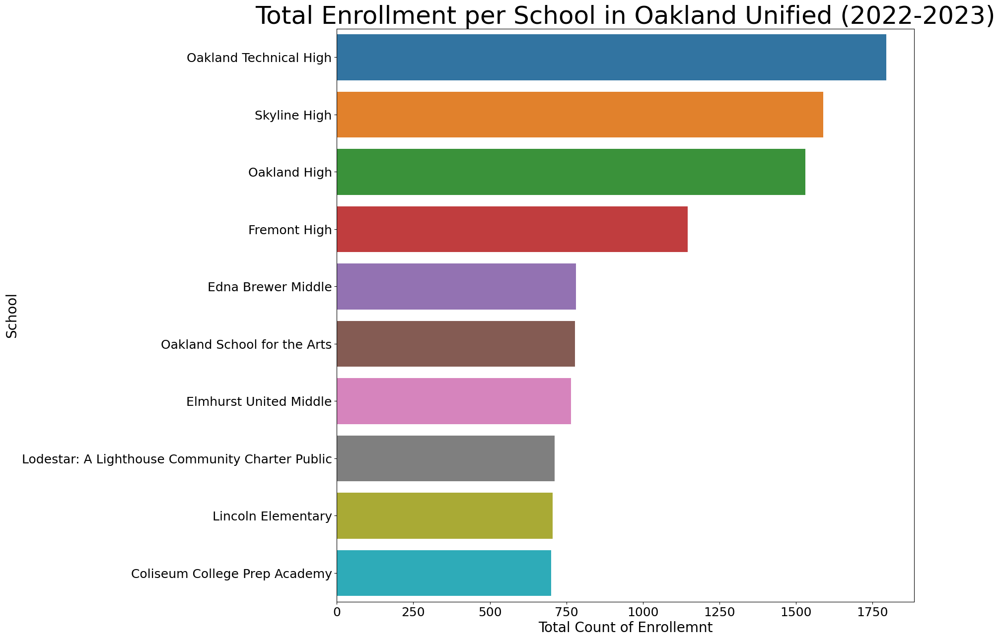

In [771]:
#get an idea of the schools in the district
OakUni_district = 'Oakland Unified'
total_enr_dist(rel_enr_22,OakUni_district)

## Oakland and Enrollment

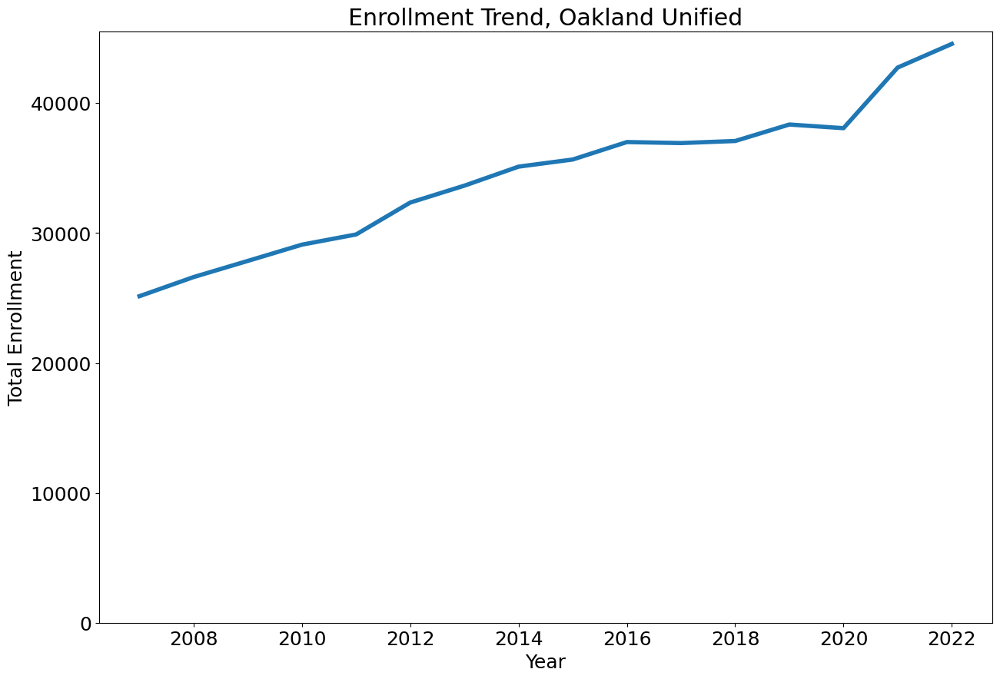

In [772]:
trend_enroll(OakUni_district)

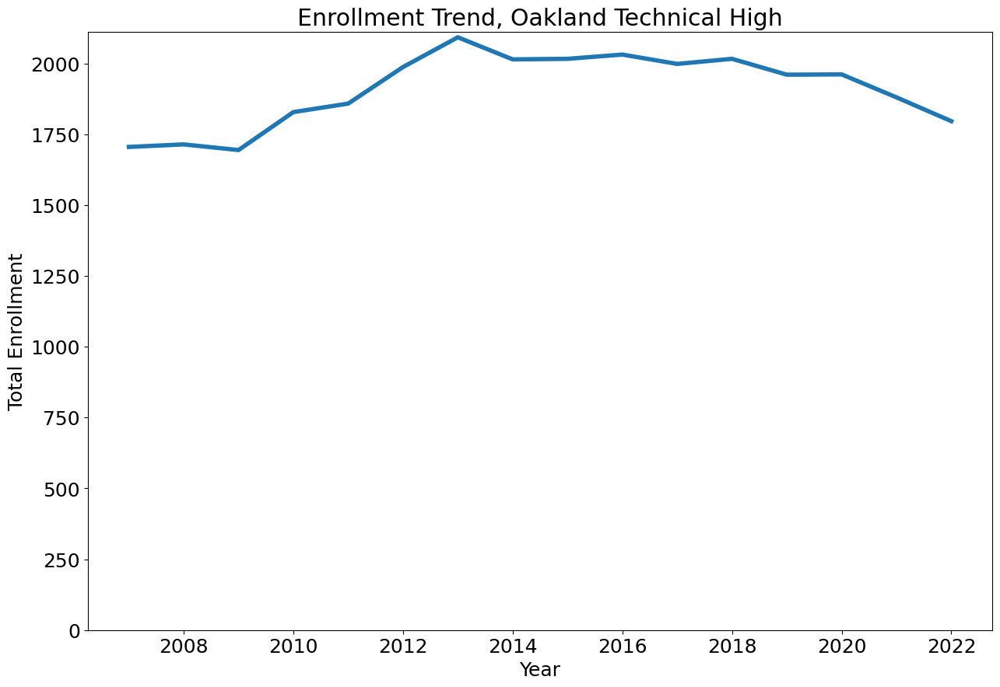

In [773]:
#looking at the trend of enrollment of the top school in enrollment of 2022-2023
trend_enroll('Oakland Technical High',is_district=False)

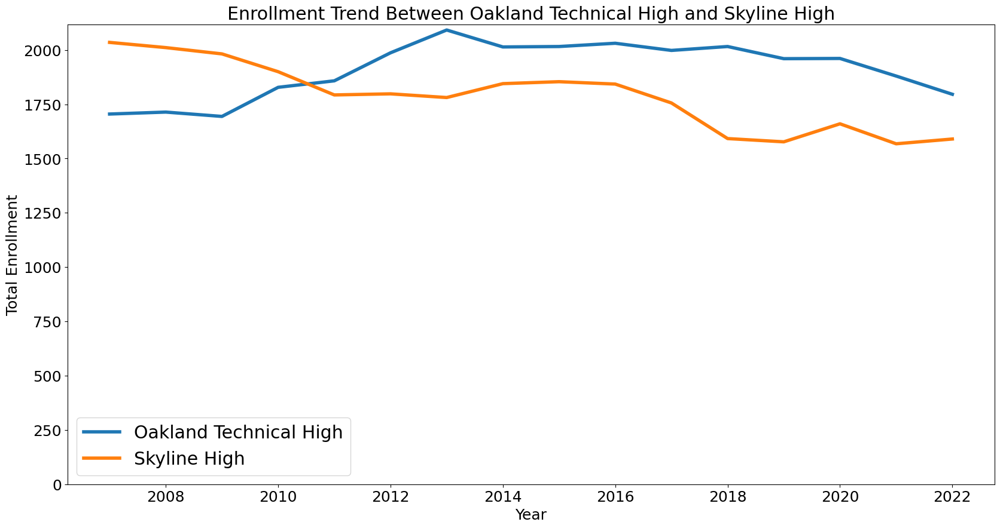

In [774]:
#looking at the top  two schools and it seems that Oakland Tech wasn't always on top
trend_two_edu('Oakland Technical High','Skyline High',is_district=False)

## Oakland Demographics (Gender/Ethnicity)

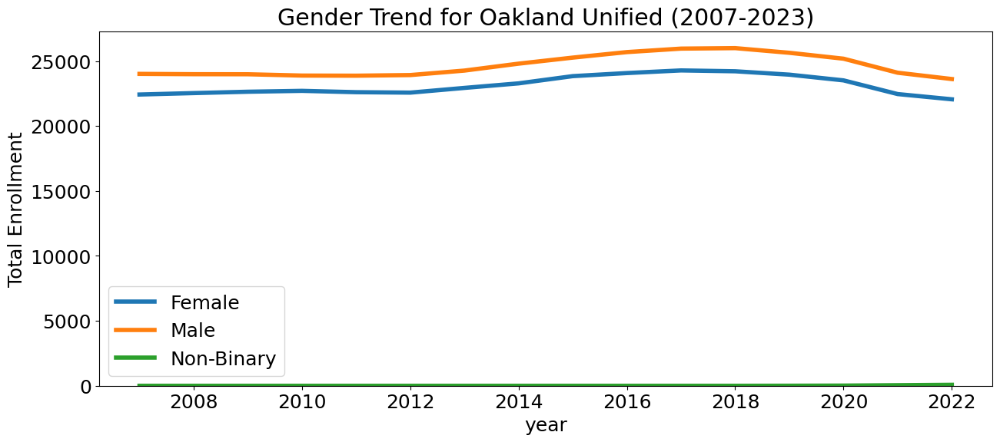

In [775]:
#it seems the total of enrollment of males has been always been on top compered to females
gender_trend(OakUni_district)

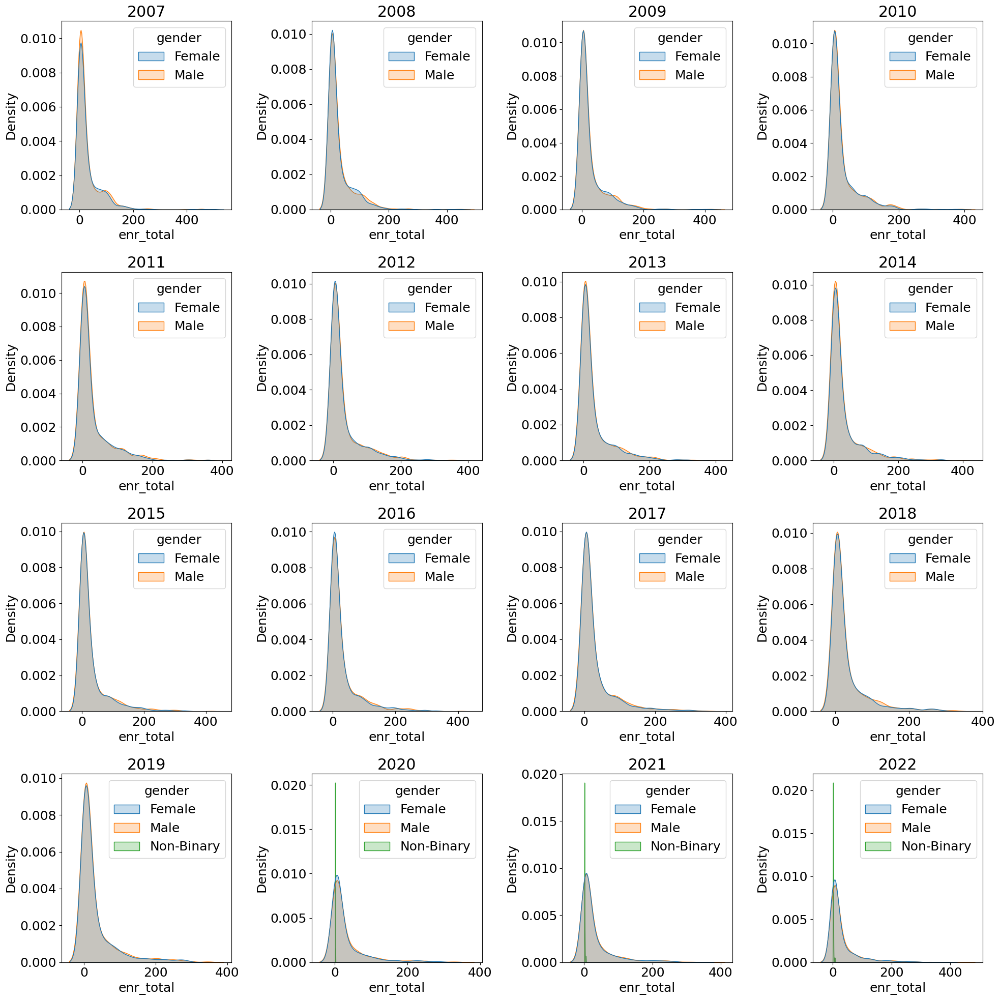

In [776]:
gender_distr_edu_facet(OakUni_district)

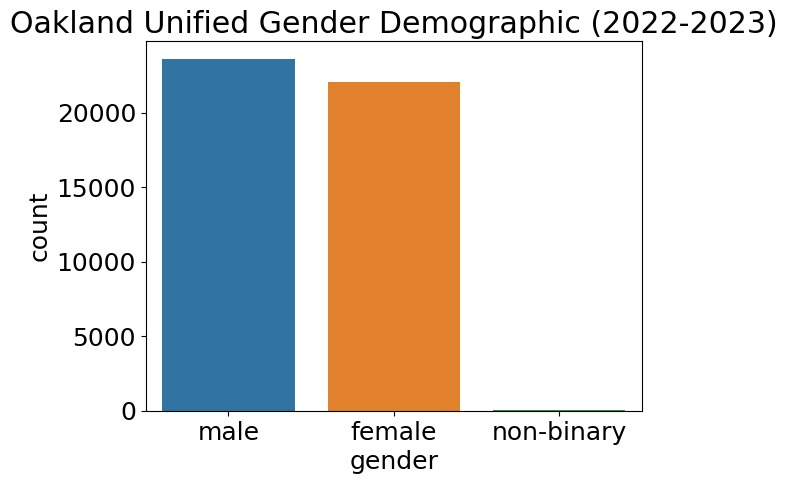

'At Oakland Unified, males make up 52% and females make up 48% and non-binary students make up 0% with a total of 45741 students in 2022-2023'

In [777]:
gender_stat(rel_enr_22,OakUni_district)

["Asian's: 10.07%",
 "African American's: 20.09%",
 "Hispanic or Latino's: 49.37%",
 'Mixed: 5.93%',
 'White: 9.46%',
 'Filipino: 0.75%',
 'American Indian or Alaska Native: 0%',
 "Pacific Islander's: 0.71%",
 'Not Reported: 3.39%']

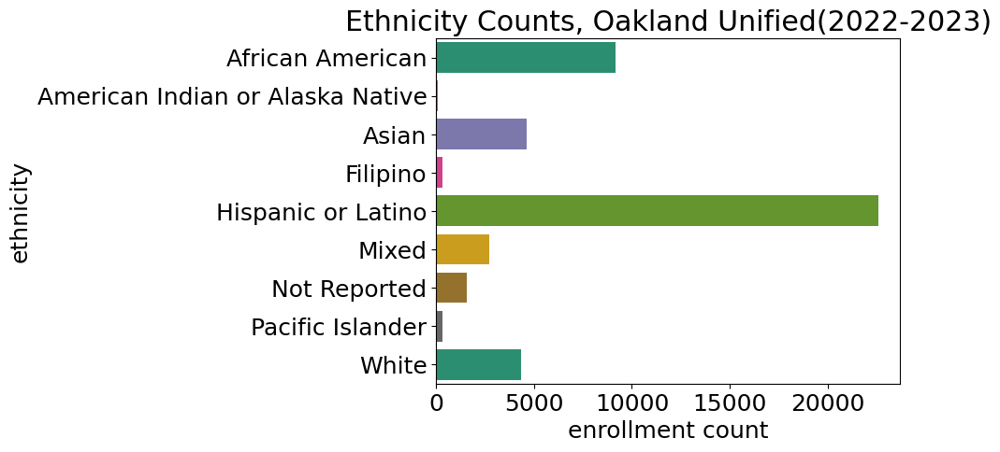

In [778]:
ethnicity_stat(rel_enr_22,OakUni_district)

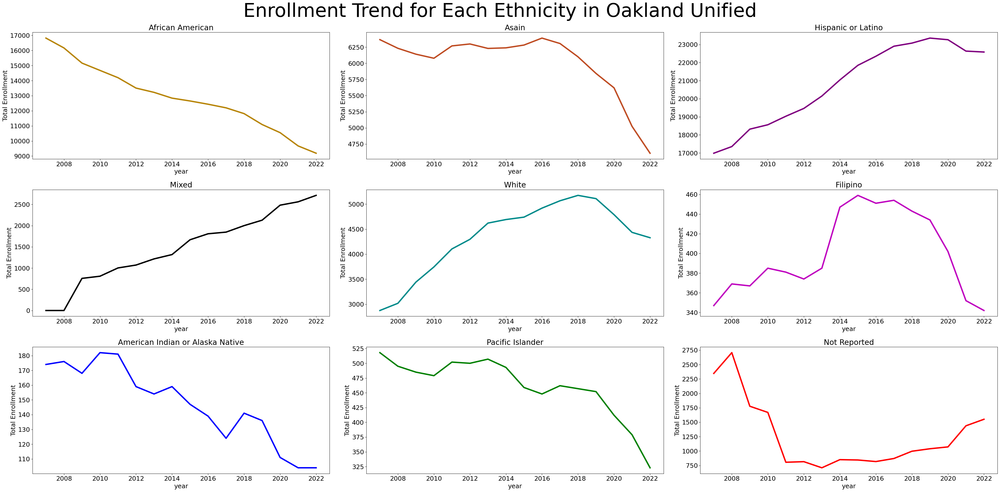

In [779]:
ethnicity_trend('Oakland Unified',is_district=True,facet=True)

### looking at top schools distribution in gender/ethnicity

#### Oakland Technical High

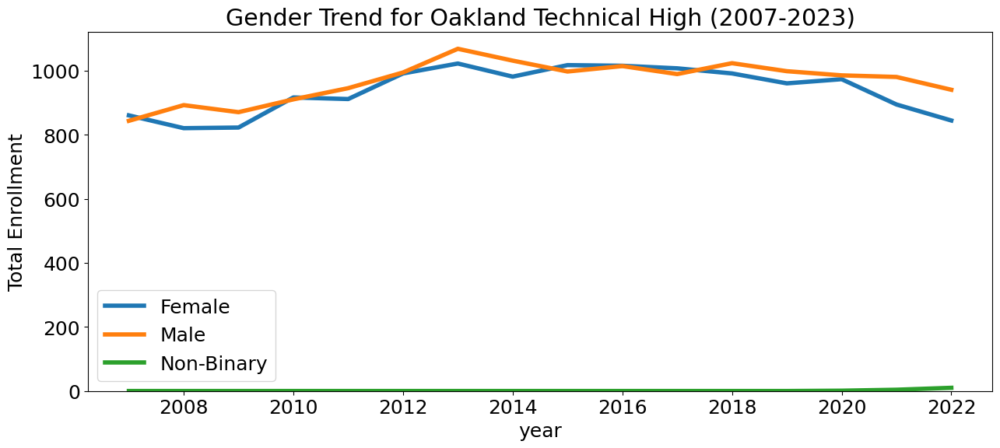

In [780]:
gender_trend('Oakland Technical High',is_district=False)

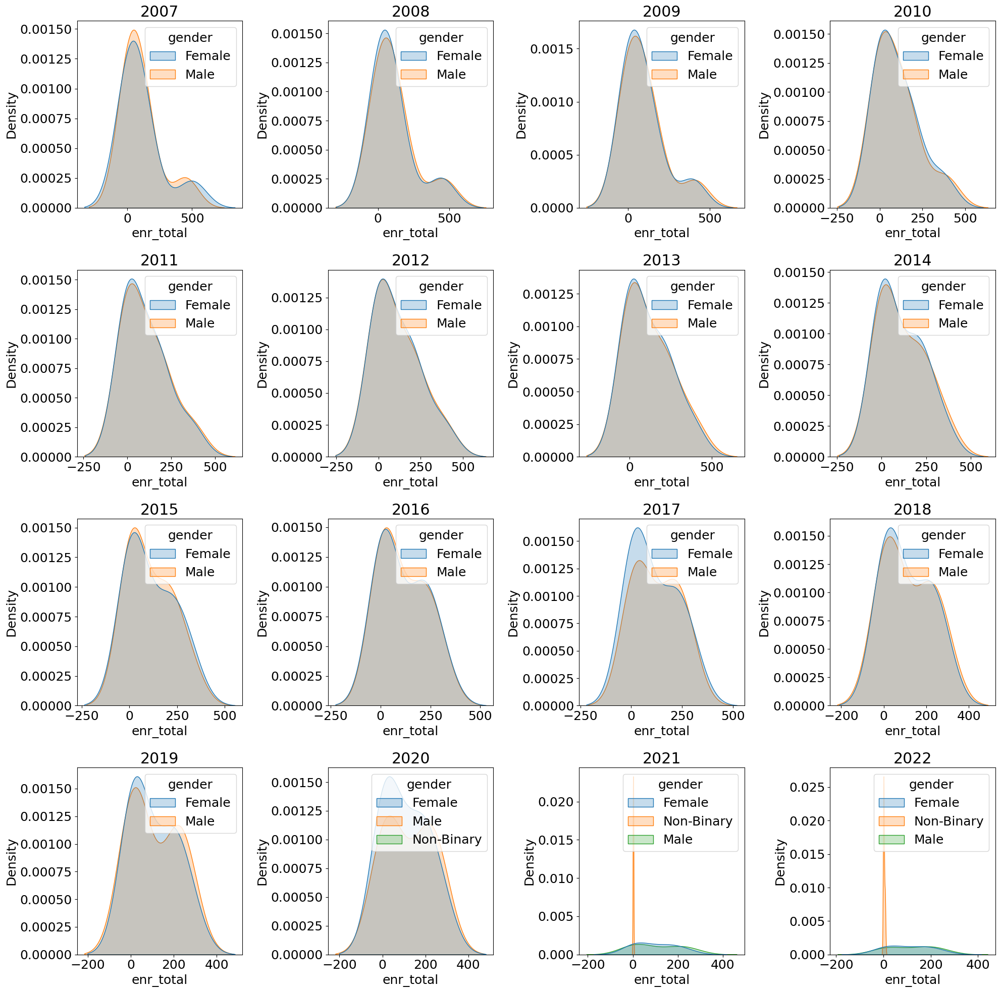

In [781]:
#its seems that since 2021 people to started idenify as non-binary. Before that Oakland Tech seems to have been more dense in females
gender_distr_edu_facet('Oakland Technical High',is_district=False)

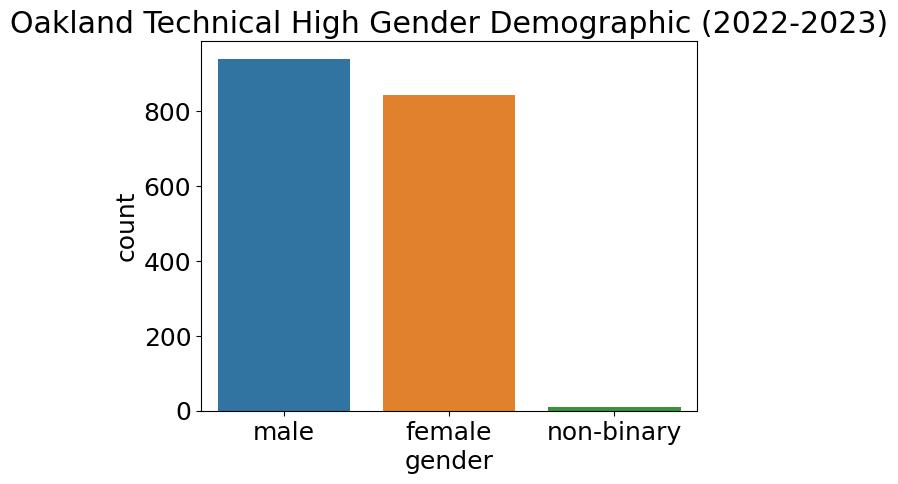

'At Oakland Technical High, males make up 52% and females make up 47% and non-binary students make up 1% with a total of There was 1796 students enrolled in Oakland Technical High (2022-2023) students in 2022-2023'

In [782]:
gender_stat(rel_enr_22,'Oakland Technical High',is_district=False)

["Asian's: 15.48%",
 "African American's: 26.95%",
 "Hispanic or Latino's: 21.44%",
 'Mixed: 10.02%',
 'White: 22.44%',
 'Filipino: 0.95%',
 'American Indian or Alaska Native: 0%',
 "Pacific Islander's: 0.11%",
 'Not Reported: 2.56%']

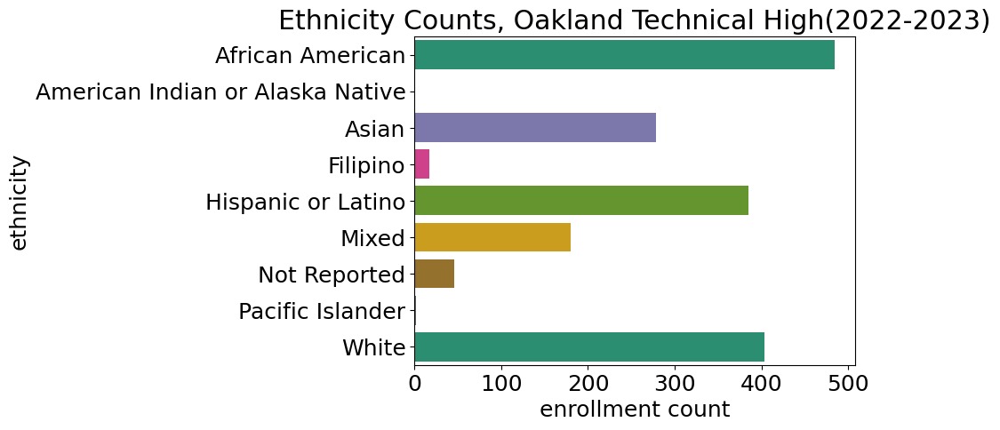

In [783]:

ethnicity_stat(rel_enr_22,'Oakland Technical High',is_district=False)


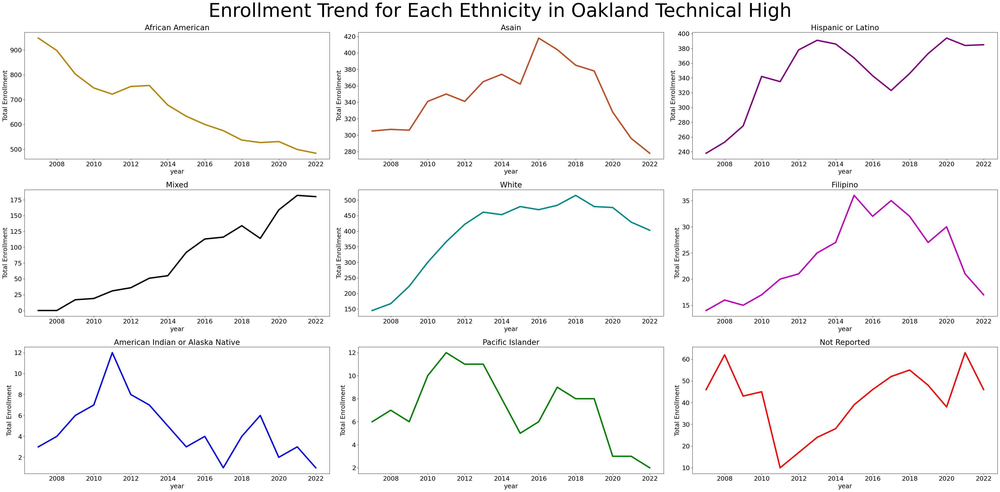

In [784]:
ethnicity_trend('Oakland Technical High',is_district=False,facet=True)

#### Skyline High

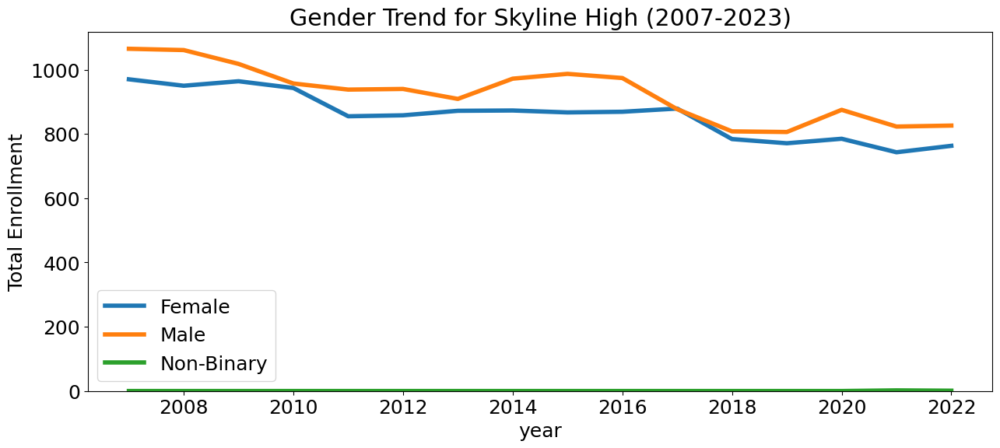

In [785]:
gender_trend('Skyline High',is_district=False)

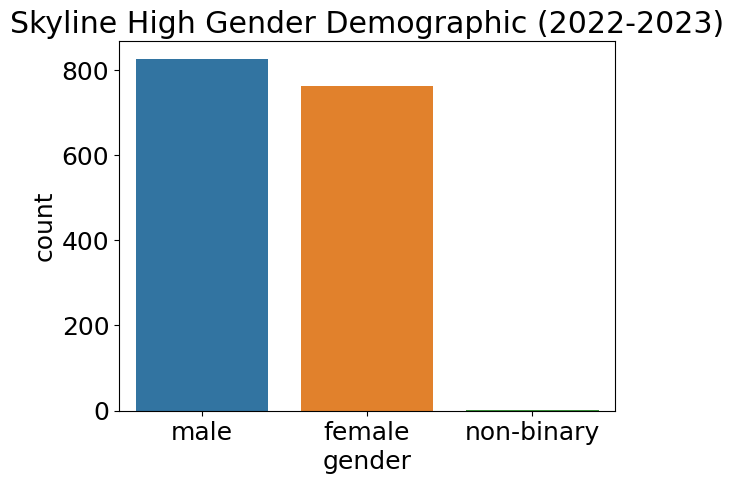

'At Skyline High, males make up 52% and females make up 48% and non-binary students make up 0% with a total of There was 1590 students enrolled in Skyline High (2022-2023) students in 2022-2023'

In [786]:
gender_stat(rel_enr_22,'Skyline High',is_district=False)

["Asian's: 10.13%",
 "African American's: 25.53%",
 "Hispanic or Latino's: 38.93%",
 'Mixed: 7.36%',
 'White: 12.26%',
 'Filipino: 1.51%',
 'American Indian or Alaska Native: 0%',
 "Pacific Islander's: 1.32%",
 'Not Reported: 2.58%']

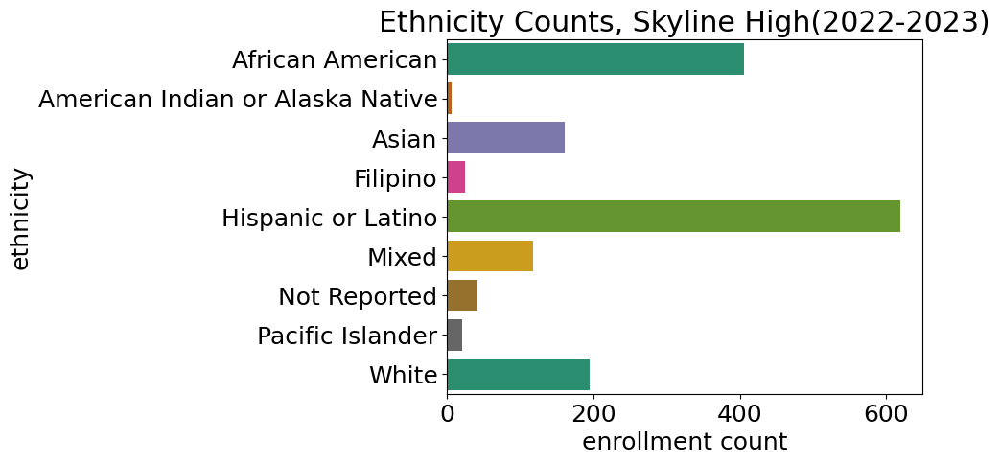

In [787]:

ethnicity_stat(rel_enr_22,'Skyline High',is_district=False)


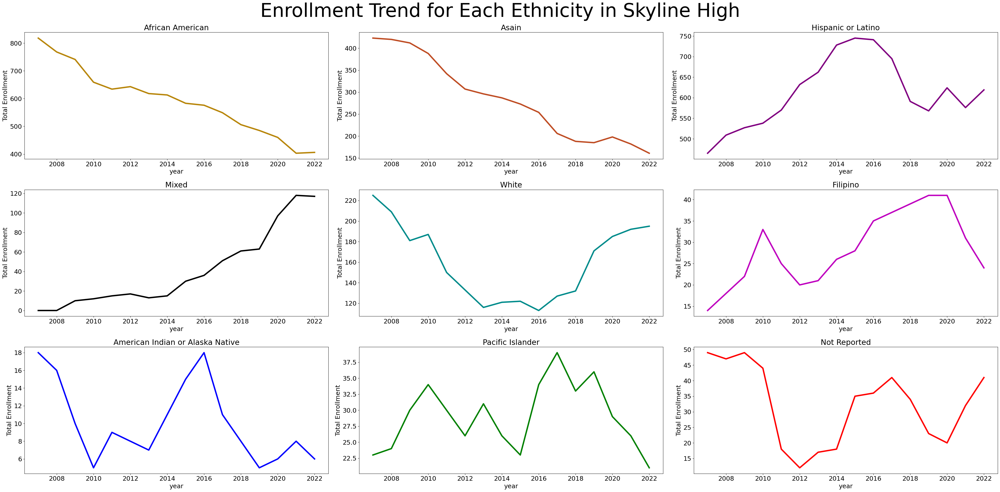

In [788]:
ethnicity_trend('Skyline High',is_district=False,facet=True)

#### Predicting Future Total Enrollment for Oakland

'The projection of total enrollment for Oakland Unified in 2050 is to be 75132. Which is 29391 more students than 2023'

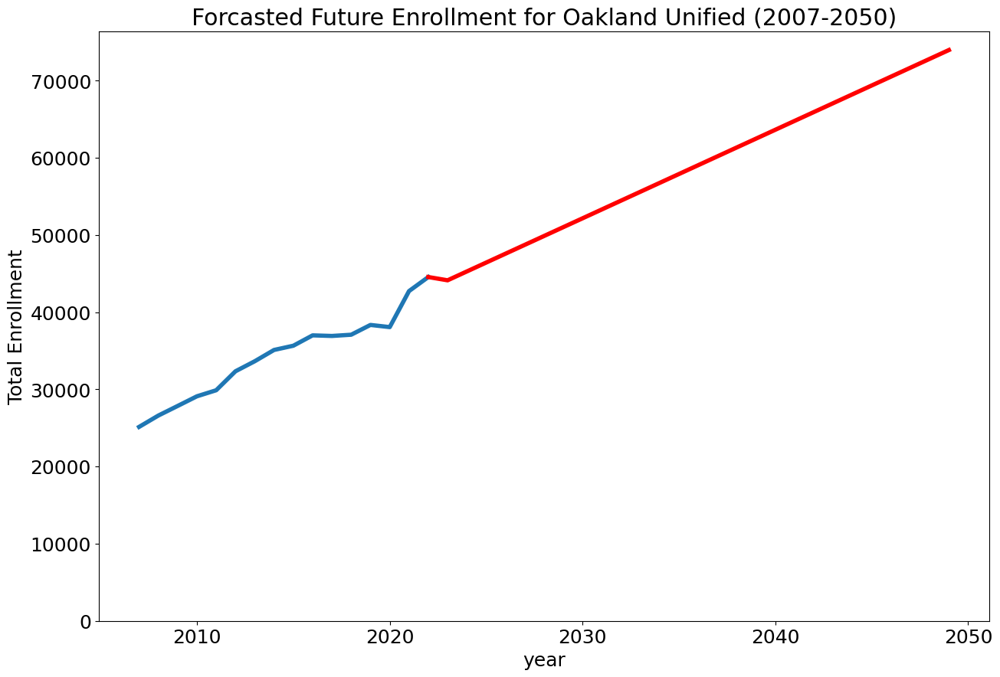

In [789]:
forecast_future_enrol(OakUni_district,2050)

['Predicted enrollment for Oakland Technical High in 2050: 2360',
 'Predicted enrollment for Skyline High in 2050: 727',
 'The disparity in enrollment between Oakland Technical High and Skyline High is 1633, indicating that Oakland Technical High is projected to have more students than Skyline High in 2050.']

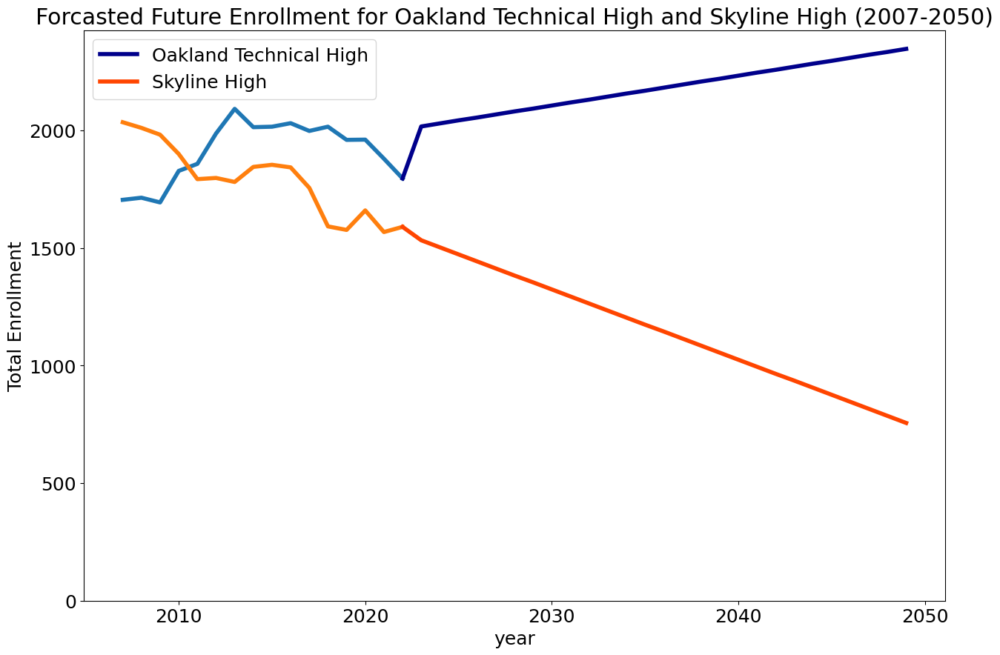

In [790]:
#it seems that Oakland Tech will ultimately be on top for the next 25 years in total enrollment
forecast_two_future_enrol('Oakland Technical High','Skyline High',2050,is_district=False)

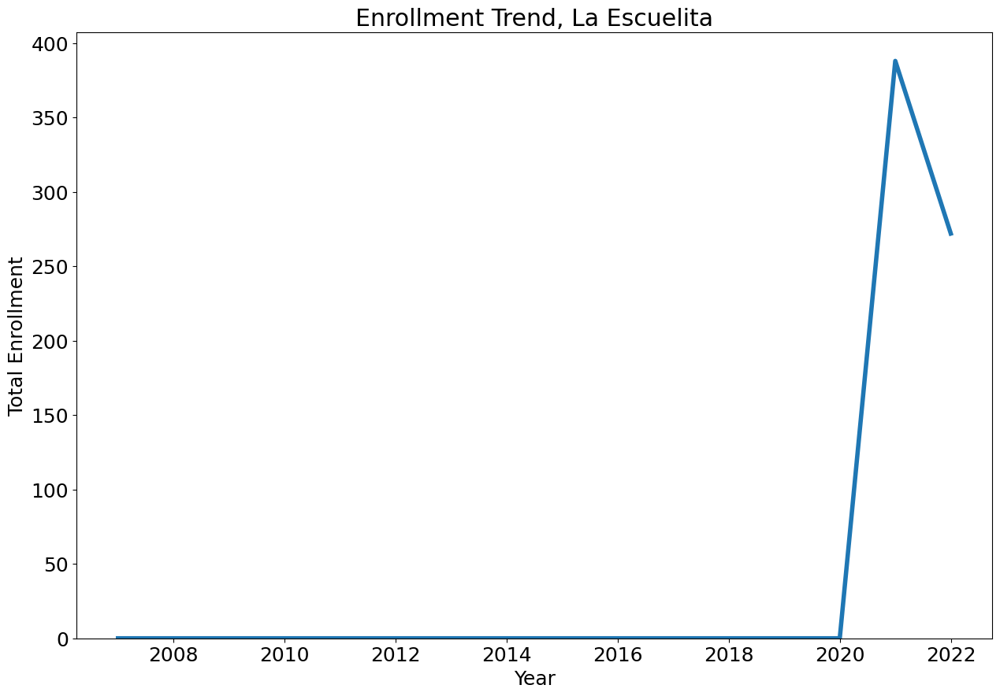

In [791]:
#The visual looks like this because there was no data recorded for this particular school unil 2020.
trend_enroll('La Escuelita',is_district=False)

'The projection of total enrollment for La Escuelita in 2100 is to be 1188. Which is 916 more students than 2023'

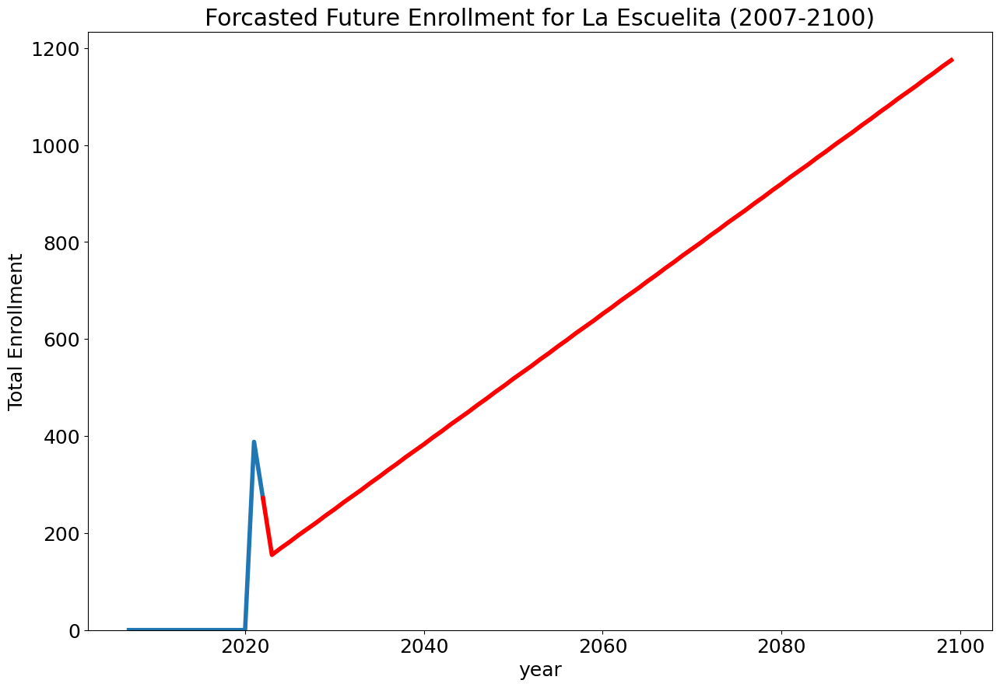

In [792]:
forecast_future_enrol('La Escuelita',2100,is_district=False)

# San Francisco Query

In [793]:

sf_closed = la_clean_cde_closed.loc[la_clean_cde_closed['district'] == 'San Francisco Unified'] #sf schools currently open and closed
sf_open = sf_closed.loc[sf_closed['statustype'] == 'Active'] #sf schools currently open



In [794]:
#find the average year schools were opened in San Francisco
sf_date_list = list(sf_closed.opendate)
sf_split_date = [re.split('/+',i) for i in sf_date_list]
sf_years =[ ''.join([i for i in sub_date if len(i) == 4]) for sub_date in sf_split_date]
int_sf_years = [int(i) for i in sf_years]
print('The average year schools opened in San Francisco is '+str(int(np.mean(int_sf_years) )) +'(closed schools included).')


sf_date_listo = list(sf_open.opendate)
sf_split_dateo = [re.split('/+',i) for i in sf_date_listo]
sf_yearso =[ ''.join([i for i in sub_date if len(i) == 4]) for sub_date in sf_split_dateo]
int_sf_yearso = [int(i) for i in sf_yearso]

print('The average year schools opened in San Francisco is '+str(int(np.mean(int_sf_yearso) )) +'(only open schools).' )




The average year schools opened in San Francisco is 1985(closed schools included).
The average year schools opened in San Francisco is 1987(only open schools).


## San Francisco and Enrollment

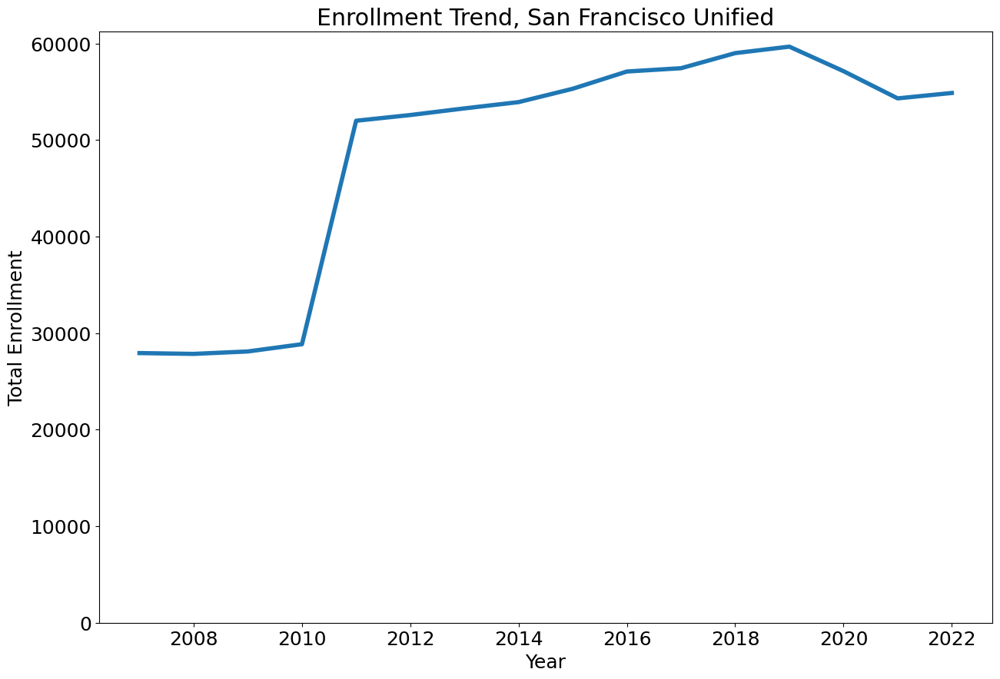

In [795]:
#Did something cause this spike or was there just more data added to SF school district.
SF_district = 'San Francisco Unified'
trend_enroll(SF_district)

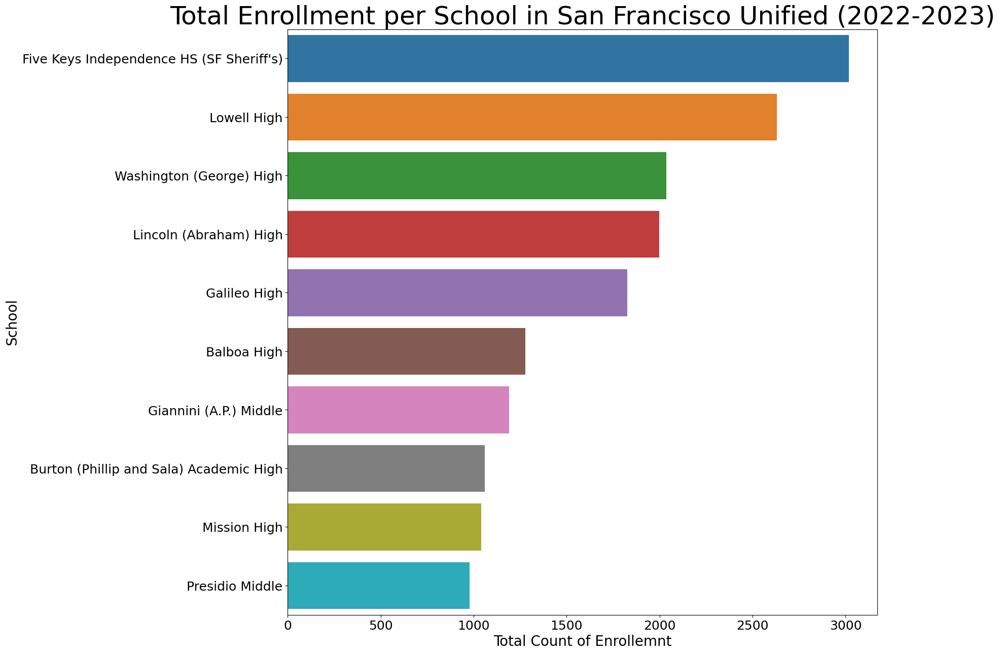

In [796]:

total_enr_dist(rel_enr_22,SF_district)

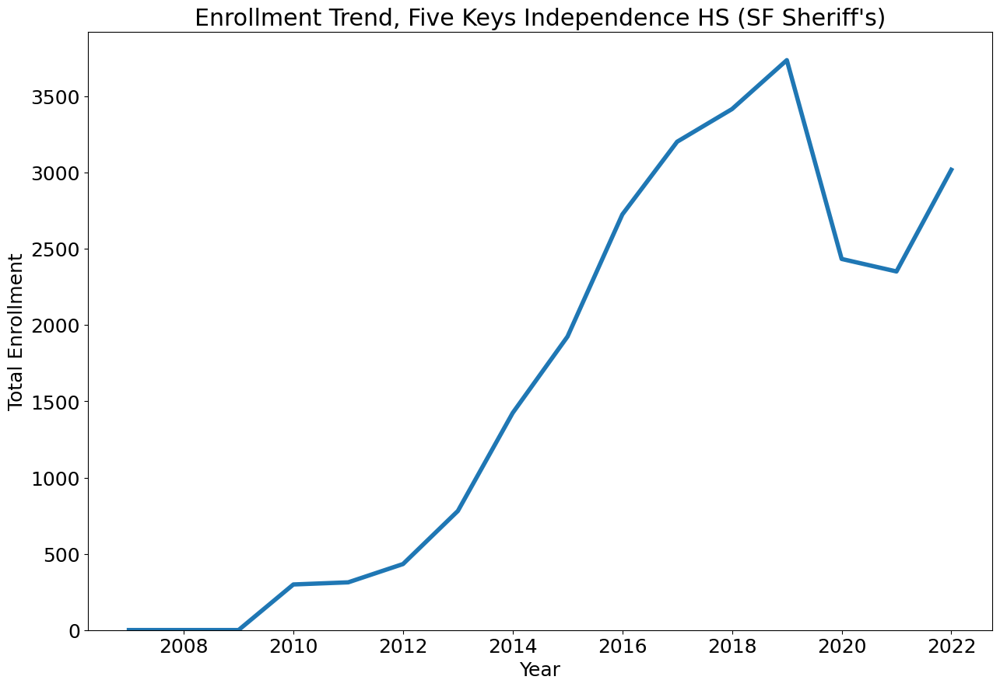

In [797]:
trend_enroll("Five Keys Independence HS (SF Sheriff's)",is_district=False)

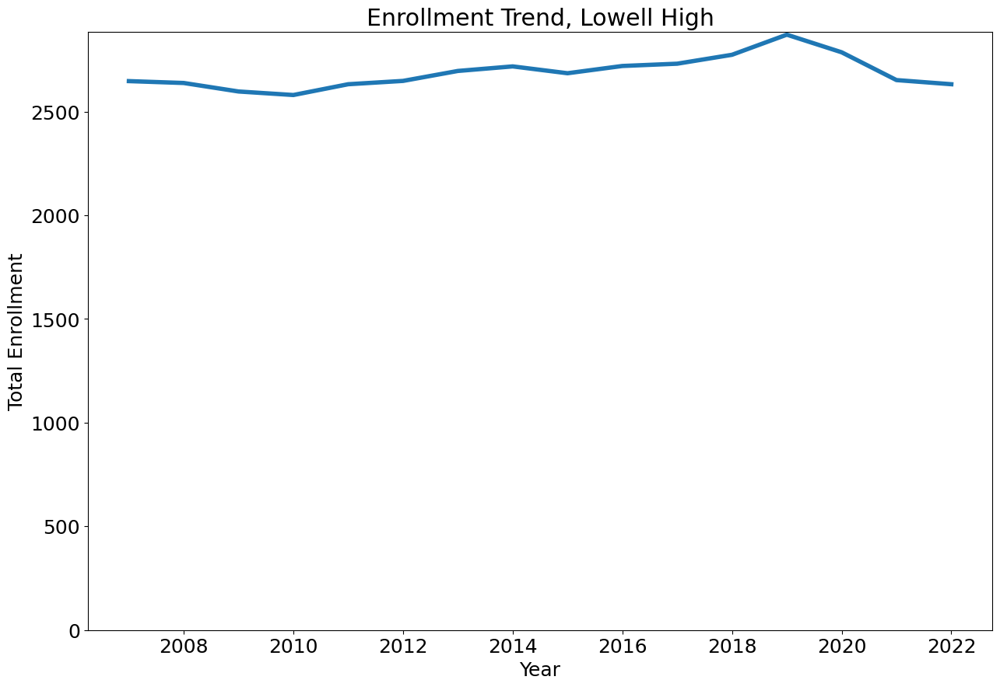

In [798]:
trend_enroll('Lowell High',is_district=False)

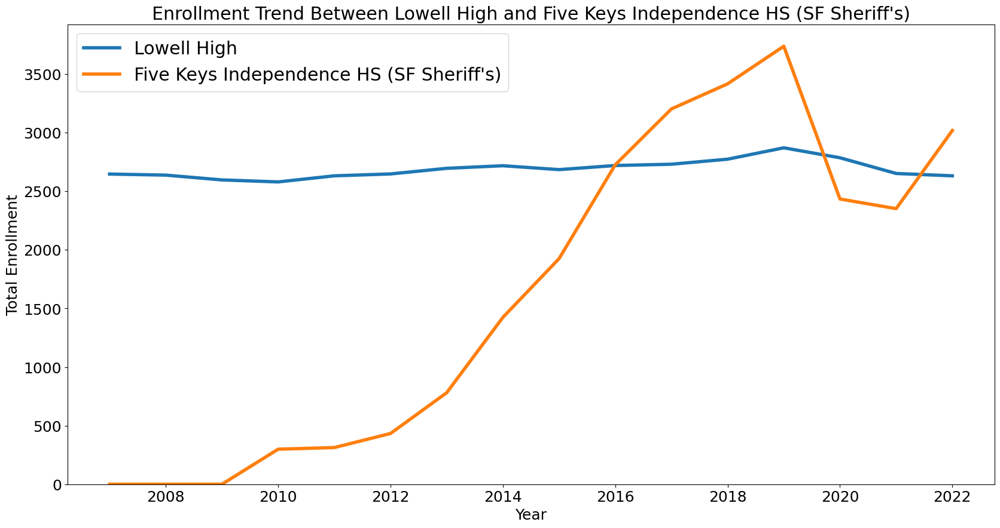

In [799]:
#FKIHS had some consistent growth in their total enrollment compred to LH which seems to be more 'steady'
trend_two_edu('Lowell High',"Five Keys Independence HS (SF Sheriff's)",is_district=False)

## SF Demographics (Gender/Ethnicity)

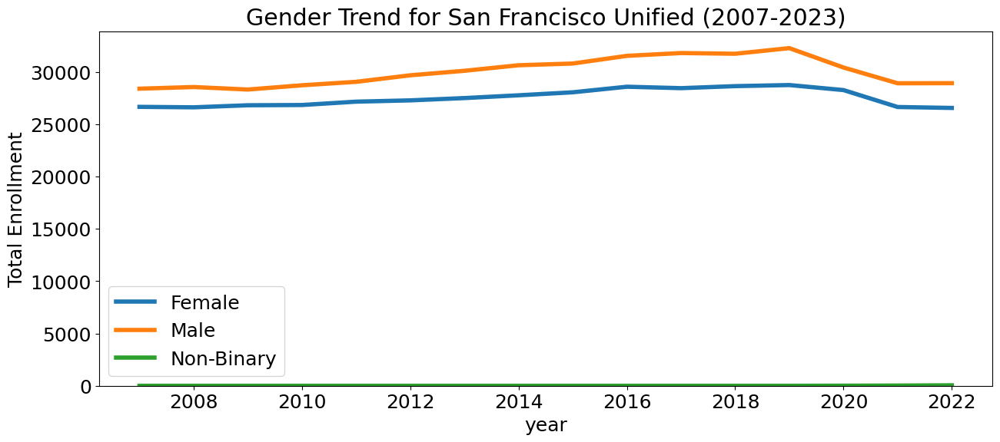

In [800]:
gender_trend(SF_district)

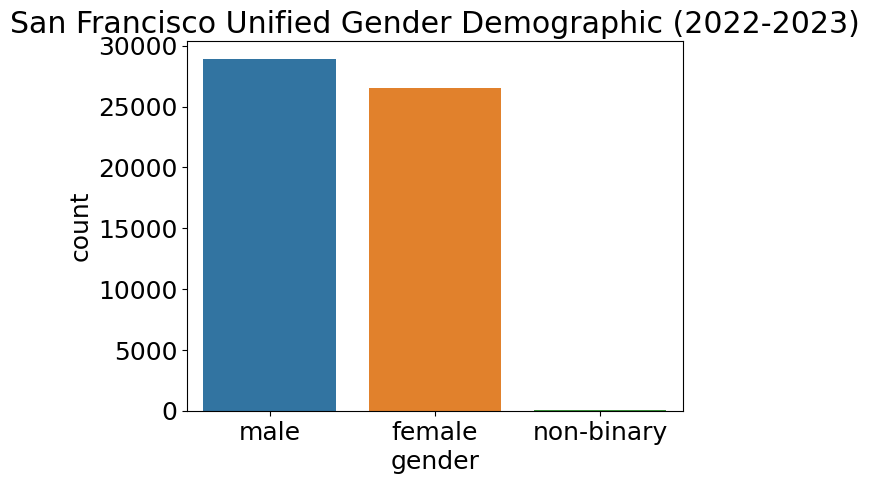

'At San Francisco Unified, males make up 52% and females make up 48% and non-binary students make up 0% with a total of 55537 students in 2022-2023'

In [801]:
gender_stat(rel_enr_22,SF_district)

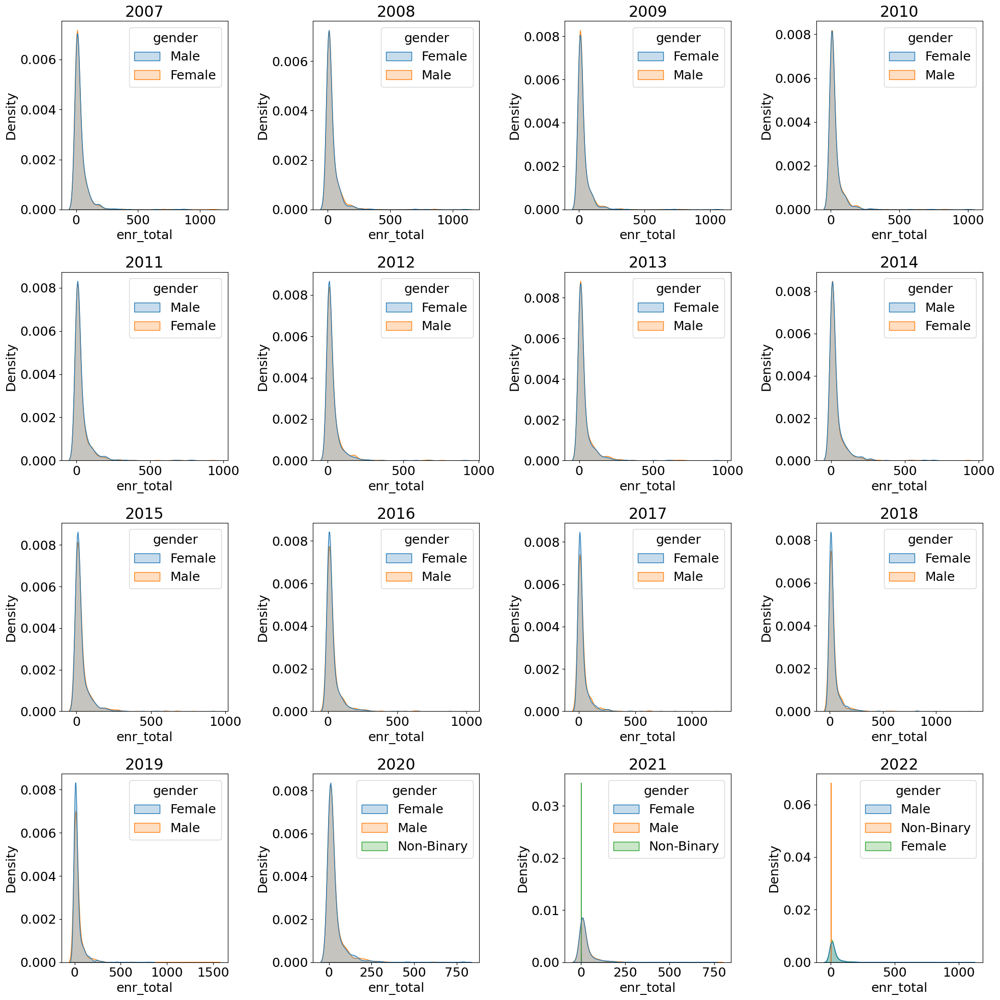

In [802]:
#The district had peak enrollement in 2019 accodring to its enrollment trend plot. We can say it peak was made 
#of a majority of females
gender_distr_edu_facet(SF_district)

["Asian's: 29.21%",
 "African American's: 7.31%",
 "Hispanic or Latino's: 34.49%",
 'Mixed: 7.16%',
 'White: 13.36%',
 'Filipino: 3.57%',
 'American Indian or Alaska Native: 0%',
 "Pacific Islander's: 0.74%",
 'Not Reported: 3.92%']

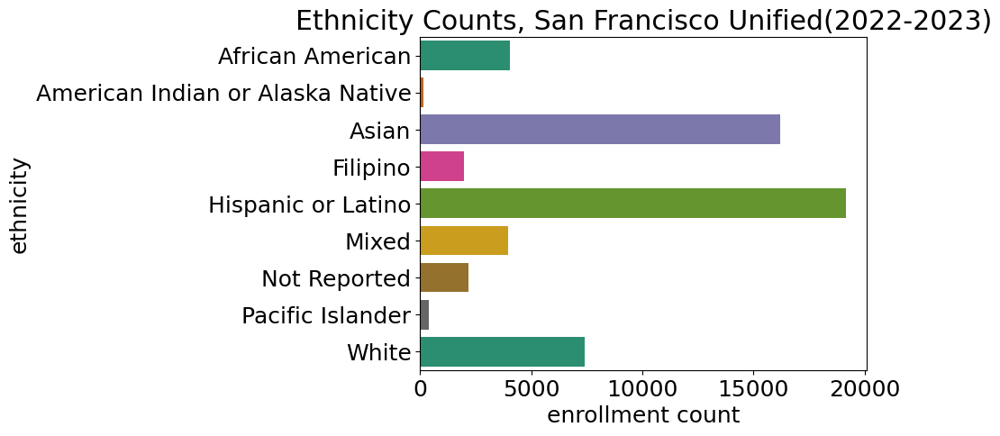

In [803]:
#recent ethnic info
ethnicity_stat(rel_enr_22,SF_district)

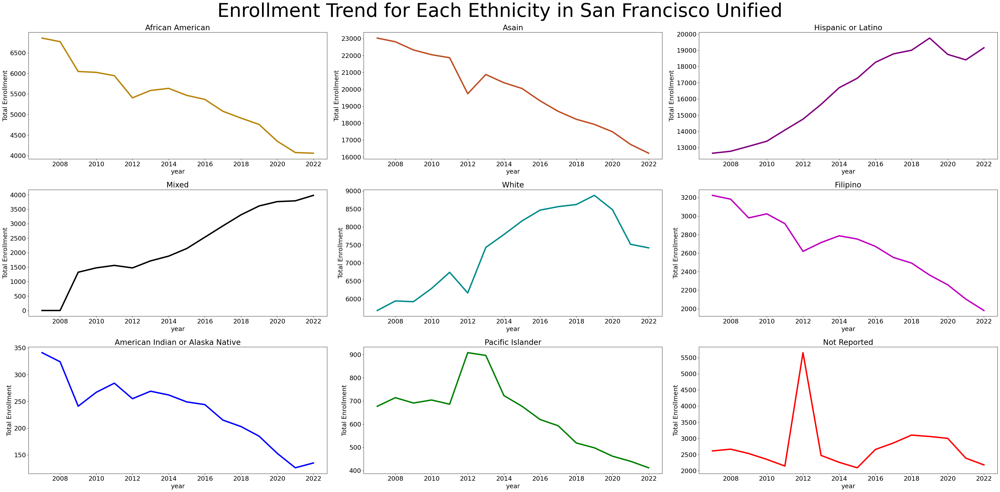

In [804]:
#their seems to some rise in the hispanic or latnio and mixed population, could this be because of
#some kind of poltics or new societal standards
ethnicity_trend(SF_district,facet=True)

### looking at top schools distribution in gender/ethnicity

#### Five Keys Independence HS (SF Sheriff's)

["Asian's: 1.19%",
 "African American's: 22.46%",
 "Hispanic or Latino's: 60.88%",
 'Mixed: 3.58%',
 'White: 9.18%',
 'Filipino: 0.73%',
 'American Indian or Alaska Native: 0%',
 "Pacific Islander's: 1.06%",
 'Not Reported: 0%']

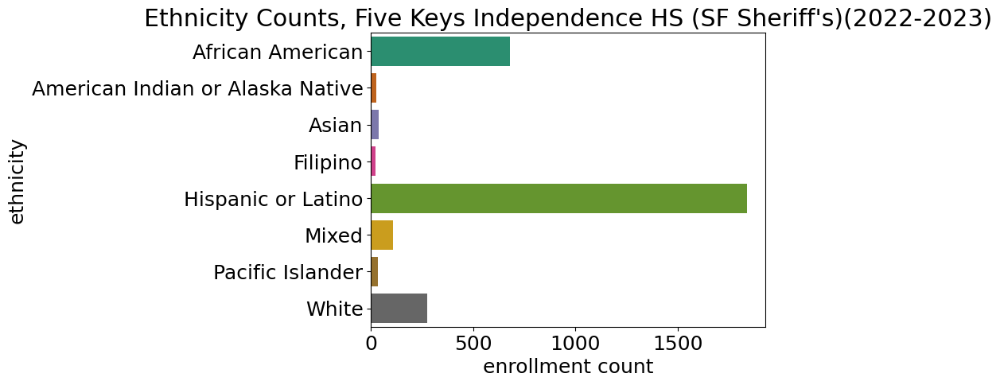

In [805]:
#recent ethnic info
ethnicity_stat(rel_enr_22,"Five Keys Independence HS (SF Sheriff's)",is_district=False)

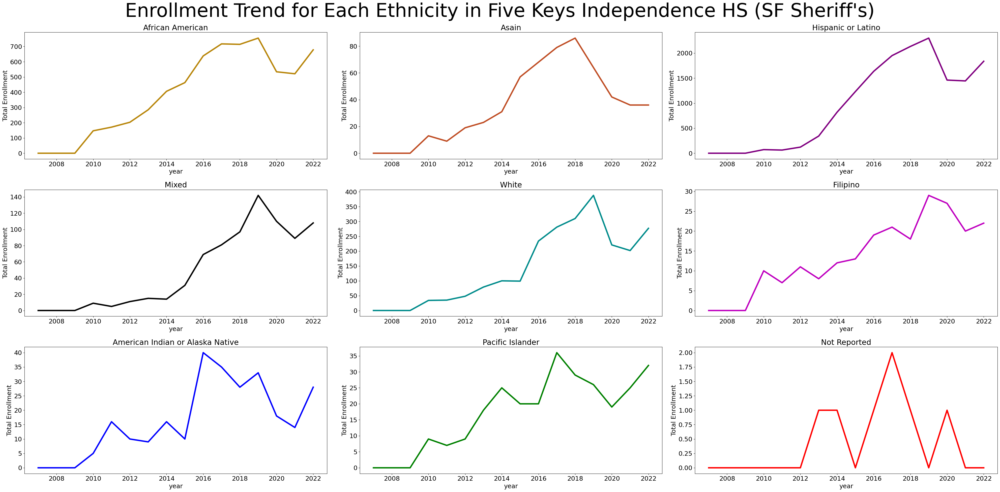

In [806]:
ethnicity_trend("Five Keys Independence HS (SF Sheriff's)",is_district=False,facet=True)

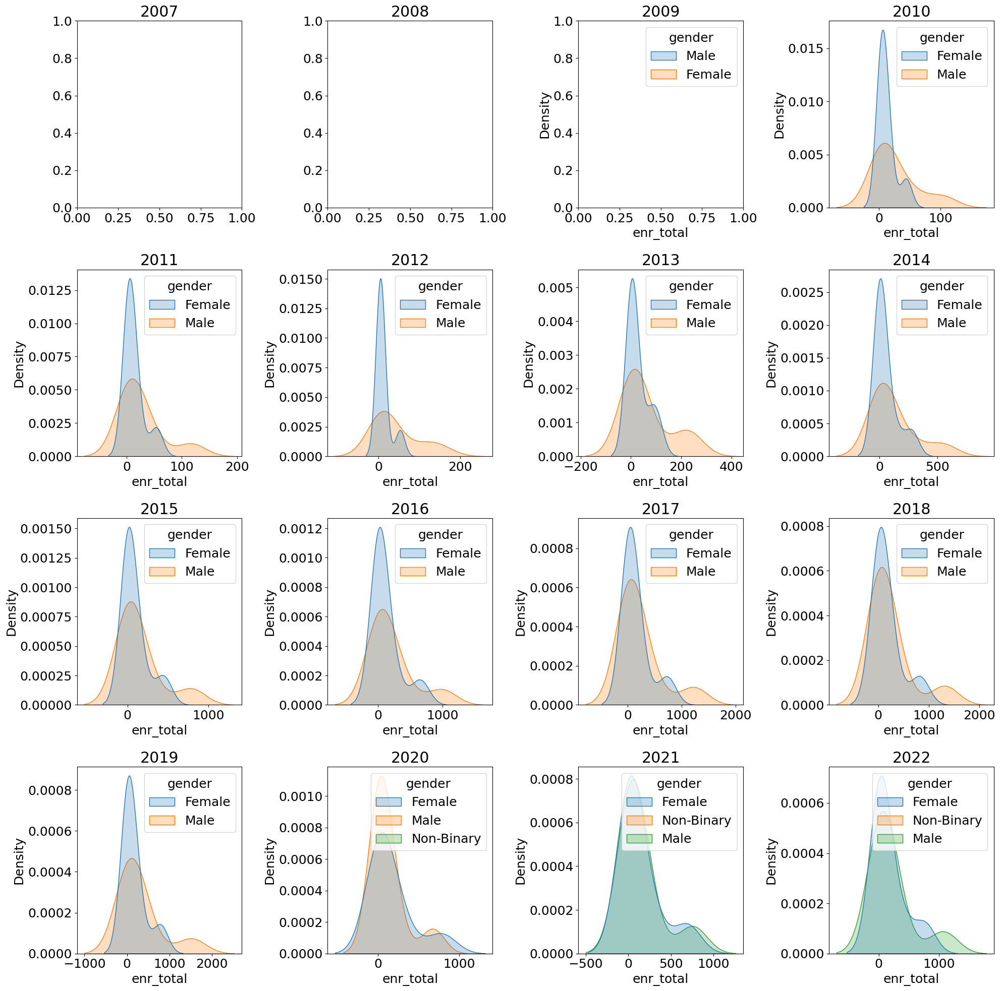

In [807]:

gender_distr_edu_facet("Five Keys Independence HS (SF Sheriff's)",is_district=False)

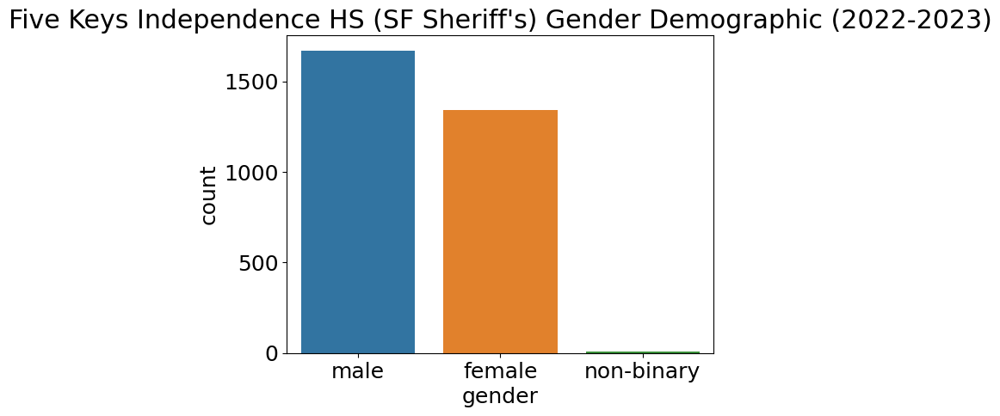

"At Five Keys Independence HS (SF Sheriff's), males make up 55% and females make up 44% and non-binary students make up 0% with a total of There was 3019 students enrolled in Five Keys Independence HS (SF Sheriff's) (2022-2023) students in 2022-2023"

In [808]:
gender_stat(rel_enr_22,"Five Keys Independence HS (SF Sheriff's)",is_district=False)

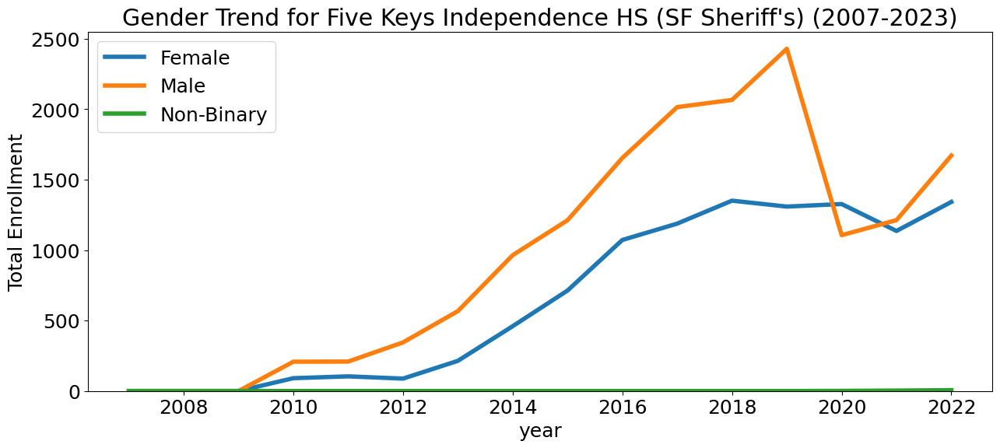

In [809]:
gender_trend("Five Keys Independence HS (SF Sheriff's)",is_district=False)

#### Lowell High

["Asian's: 46.66%",
 "African American's: 2.74%",
 "Hispanic or Latino's: 17.74%",
 'Mixed: 7.07%',
 'White: 16.79%',
 'Filipino: 5.78%',
 'American Indian or Alaska Native: 0%',
 "Pacific Islander's: 0.42%",
 'Not Reported: 2.58%']

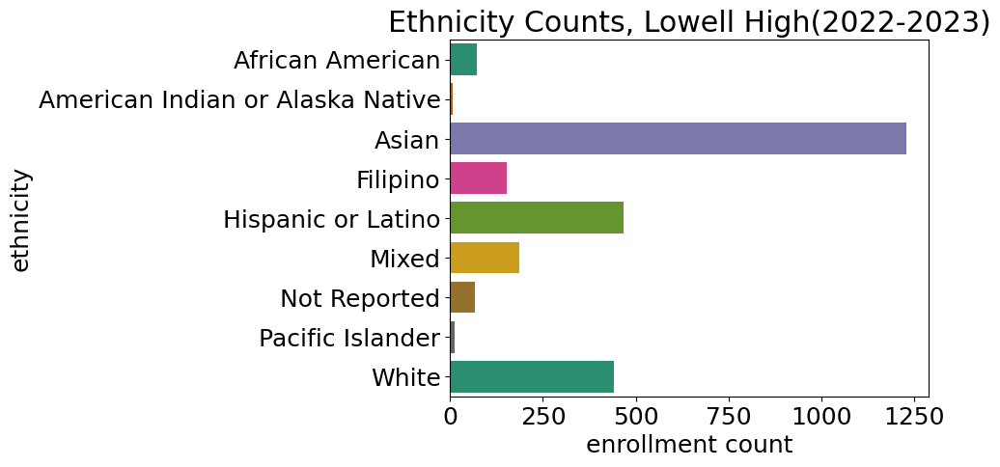

In [810]:
#recent ethnic info
ethnicity_stat(rel_enr_22,"Lowell High",is_district=False)

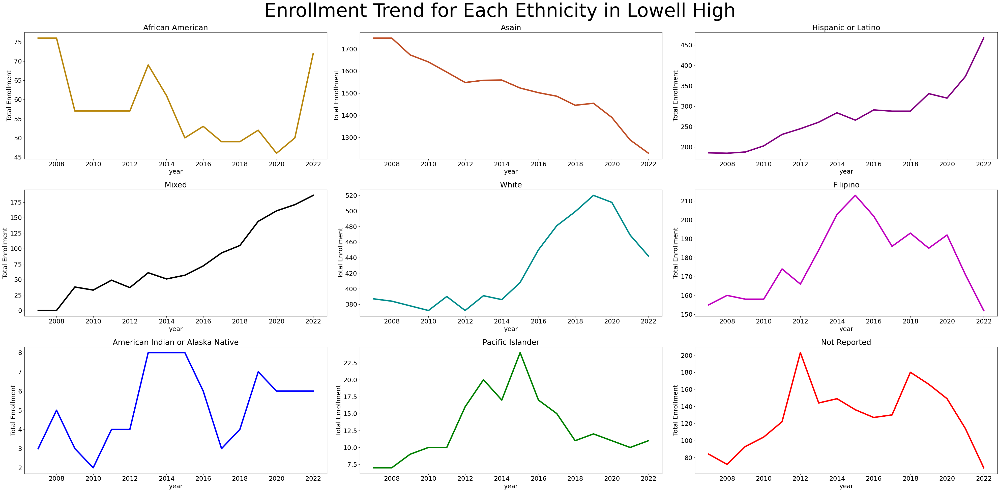

In [811]:
ethnicity_trend("Lowell High",is_district=False,facet=True)

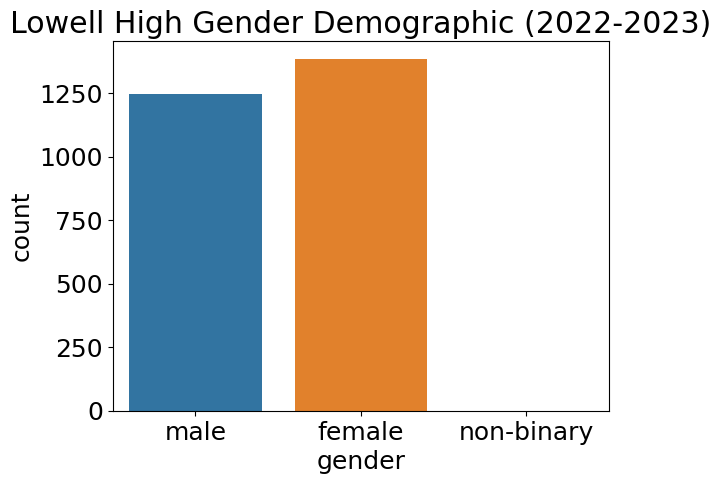

'At Lowell High, males make up 47% and females make up 53% and non-binary students make up 0% with a total of There was 2632 students enrolled in Lowell High (2022-2023) students in 2022-2023'

In [812]:
gender_stat(rel_enr_22,"Lowell High",is_district=False)

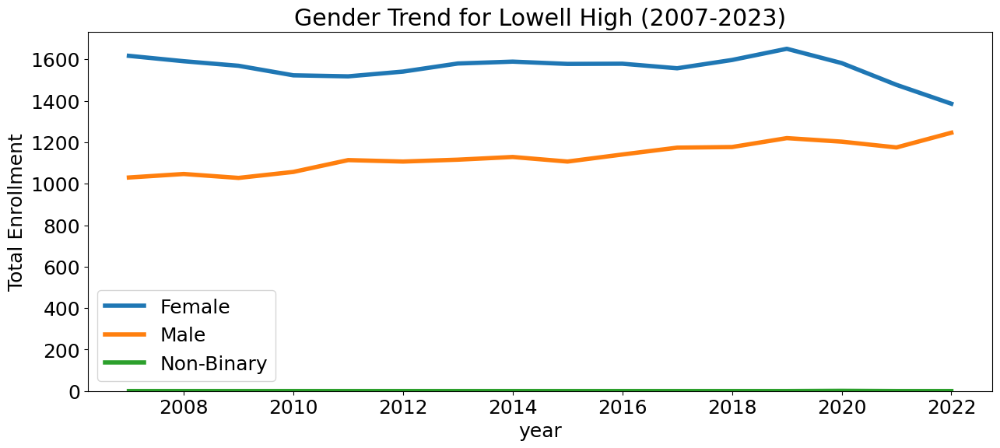

In [813]:
gender_trend("Lowell High",is_district=False)

#### Predicting Future Total Enrollment for SF


'The projection of total enrollment for San Francisco Unified in 2050 is to be 123432. Which is 67895 more students than 2023'

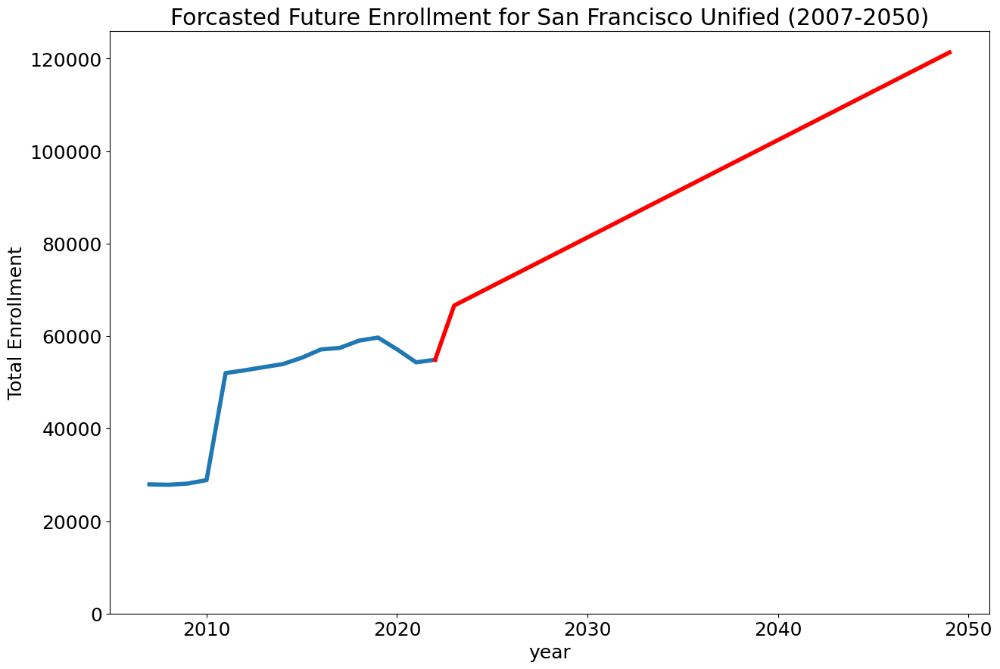

In [814]:
forecast_future_enrol(SF_district,2050)

['Predicted enrollment for Lowell High in 2050: 3007',
 "Predicted enrollment for Five Keys Independence HS (SF Sheriff's) in 2050: 10791",
 "The disparity in enrollment between Lowell High and Five Keys Independence HS (SF Sheriff's) is 7784, indicating that",
 "Five Keys Independence HS (SF Sheriff's) is projected to have more students than Lowell High in 2050."]

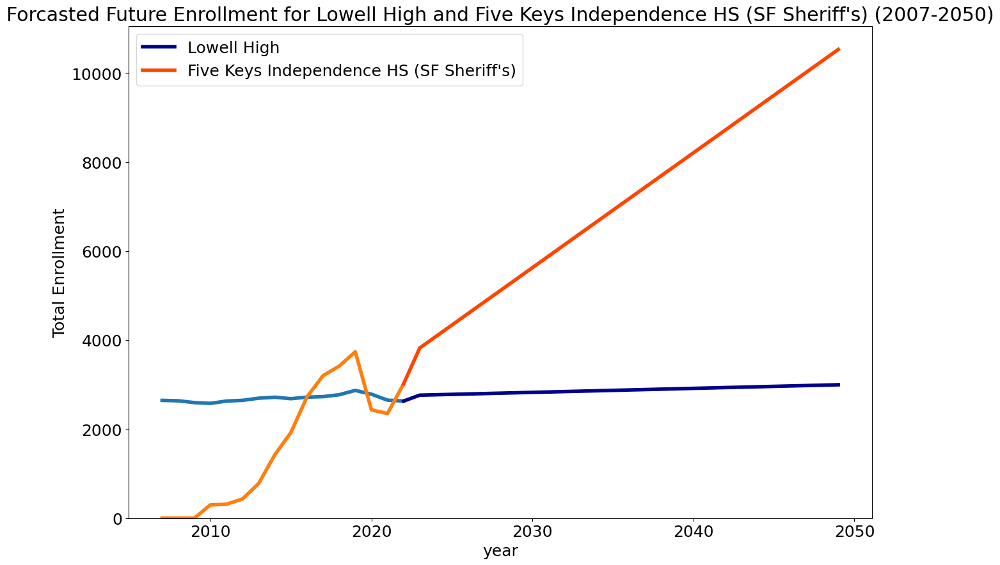

In [815]:
#interesting graph
forecast_two_future_enrol('Lowell High',"Five Keys Independence HS (SF Sheriff's)",2050,is_district=False)

## Los Angeles Query

In [816]:
search(rel_enr_22,'Los Ang')

('False, Los Ang is not in this dataset, this list may have what your looking for: ',
 ['Los Angeles County Office of Education',
  'SBE - Los Angeles College Prep Academy',
  'Los Angeles Unified'])

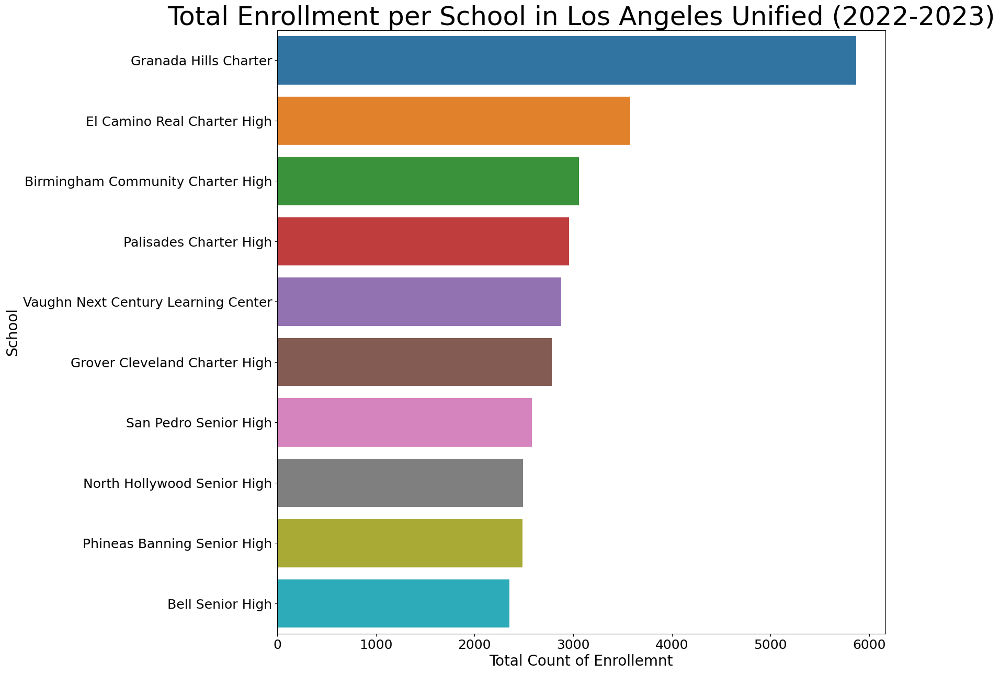

In [817]:
LA_district = 'Los Angeles Unified'
total_enr_dist(rel_enr_22,LA_district)

## LA and Enrollment

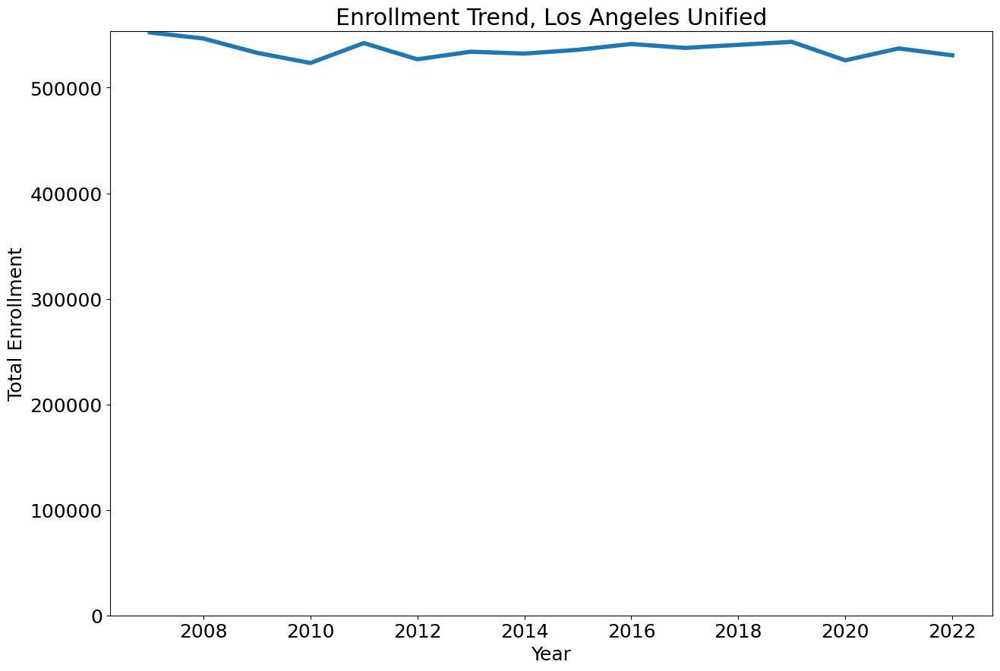

In [818]:
#has consintenly been over 500,000 over the past decade
trend_enroll(LA_district)

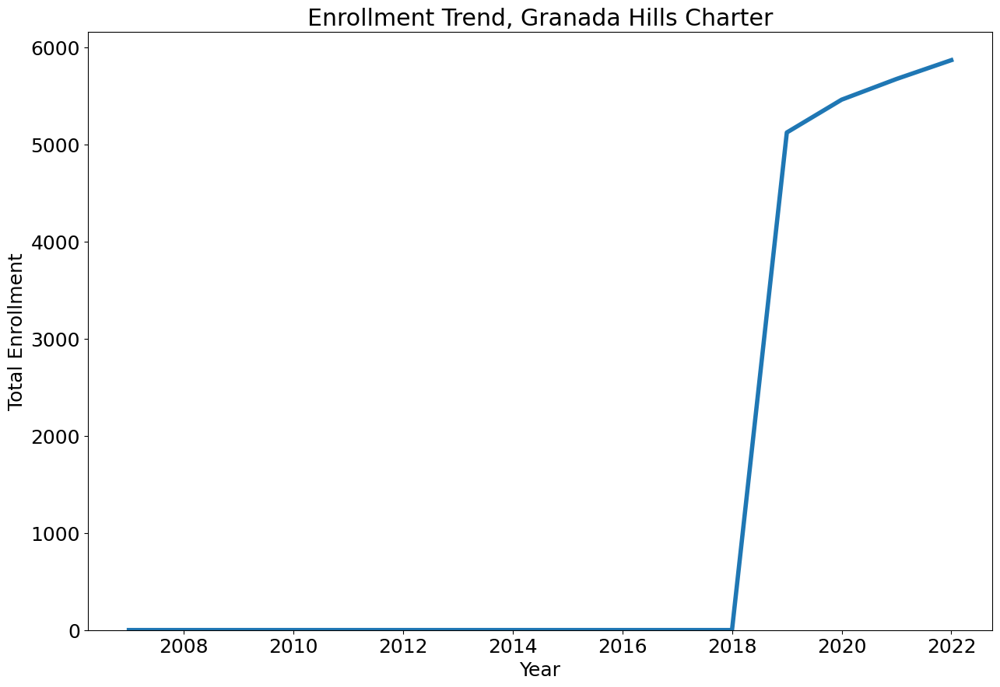

In [819]:
#my guess is that data just got added for this school
trend_enroll('Granada Hills Charter',is_district=False)

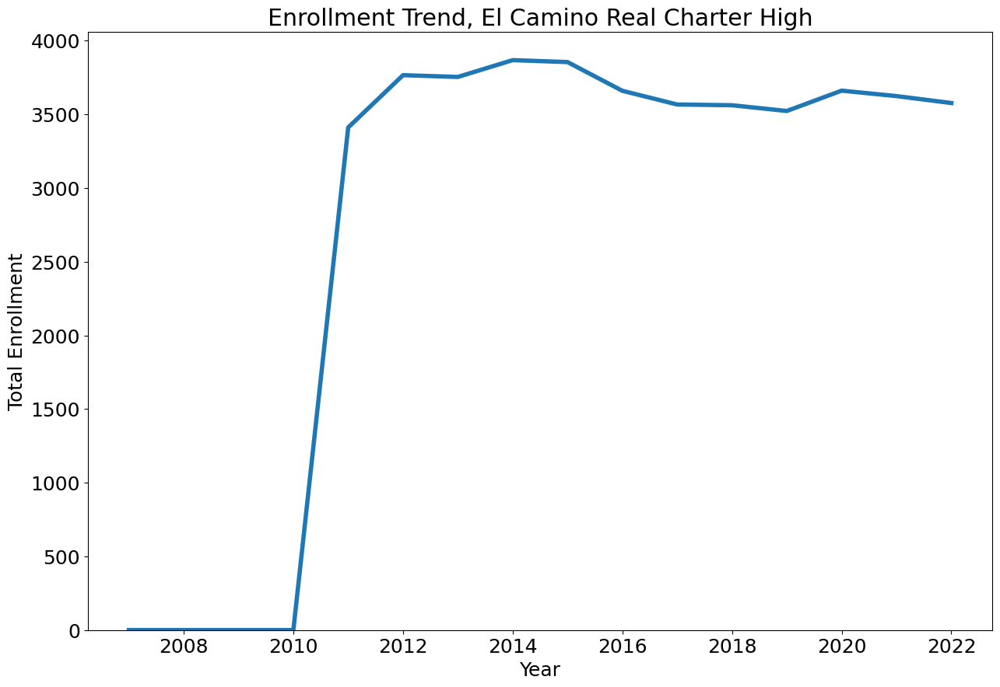

In [820]:
trend_enroll('El Camino Real Charter High',is_district=False)


## LA Demographics (Gender/Ethnicity)

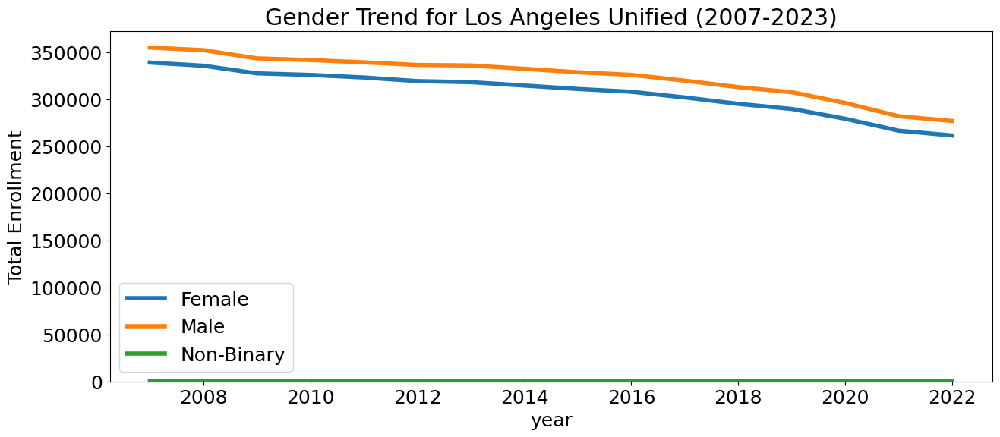

In [821]:
gender_trend(LA_district)

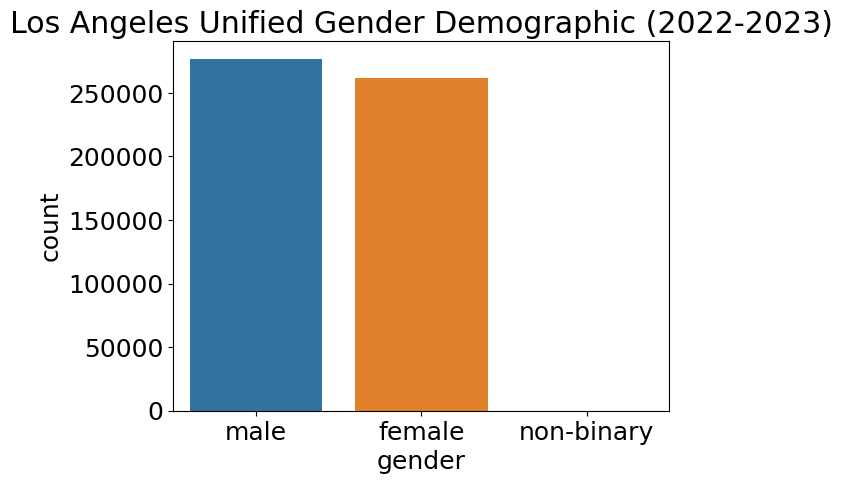

'At Los Angeles Unified, males make up 51% and females make up 49% and non-binary students make up 0% with a total of 538295 students in 2022-2023'

In [822]:
gender_stat(rel_enr_22,LA_district)

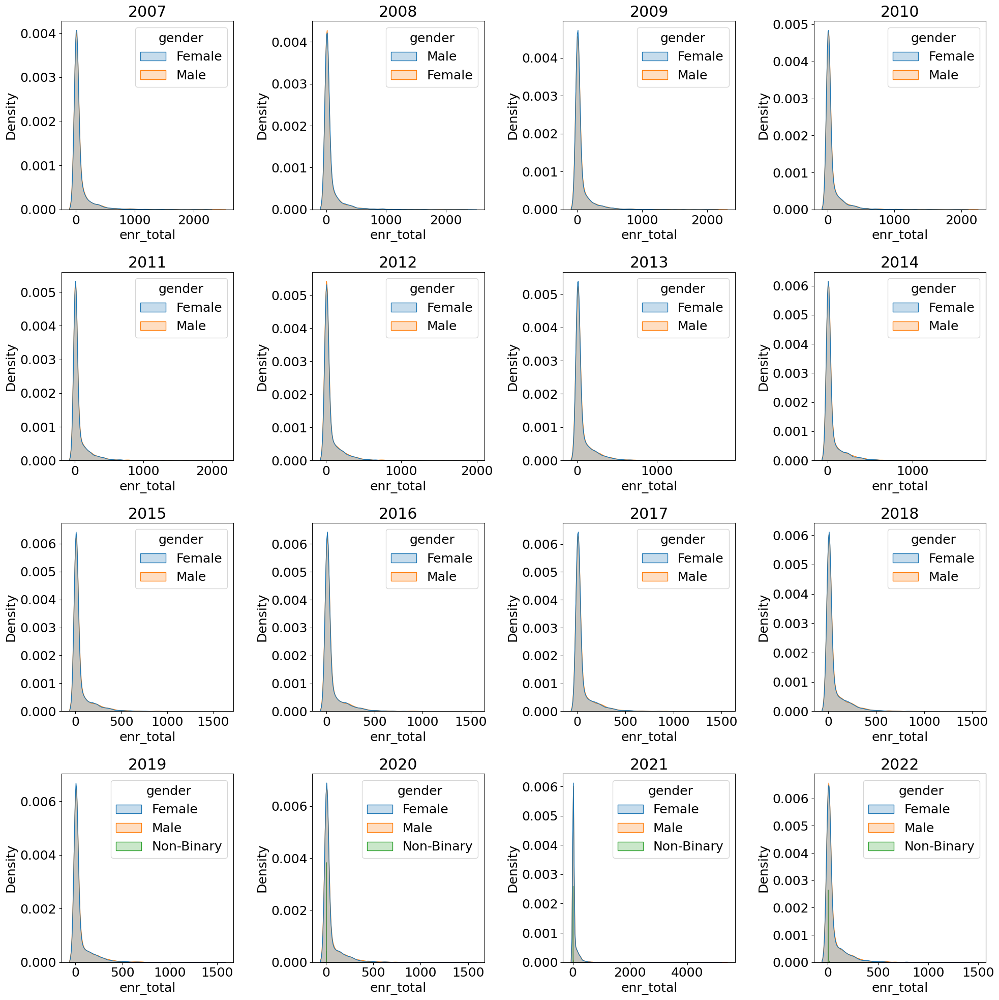

In [823]:
gender_distr_edu_facet(LA_district)

["Asian's: 1.72%",
 "African American's: 3.81%",
 "Hispanic or Latino's: 74.15%",
 'Mixed: 0.55%',
 'White: 4.81%',
 'Filipino: 0.81%',
 'American Indian or Alaska Native: 0%',
 "Pacific Islander's: 0.11%",
 'Not Reported: 13.94%']

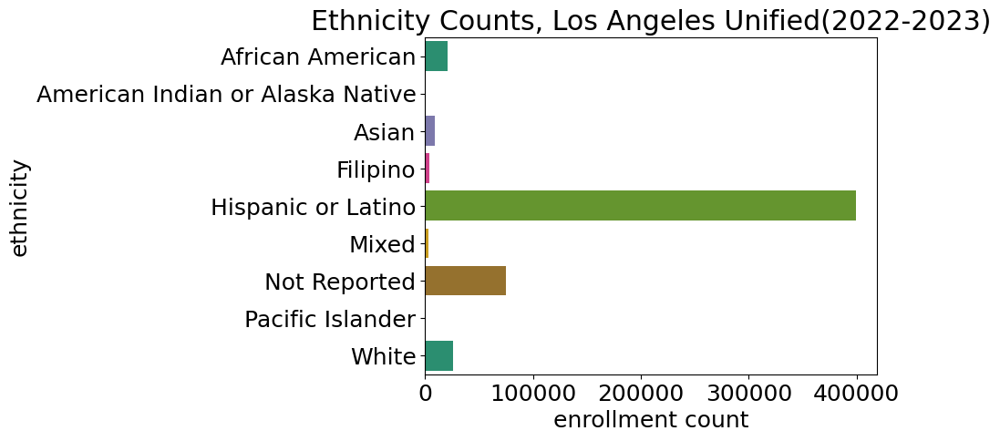

In [824]:
ethnicity_stat(rel_enr_22,LA_district)

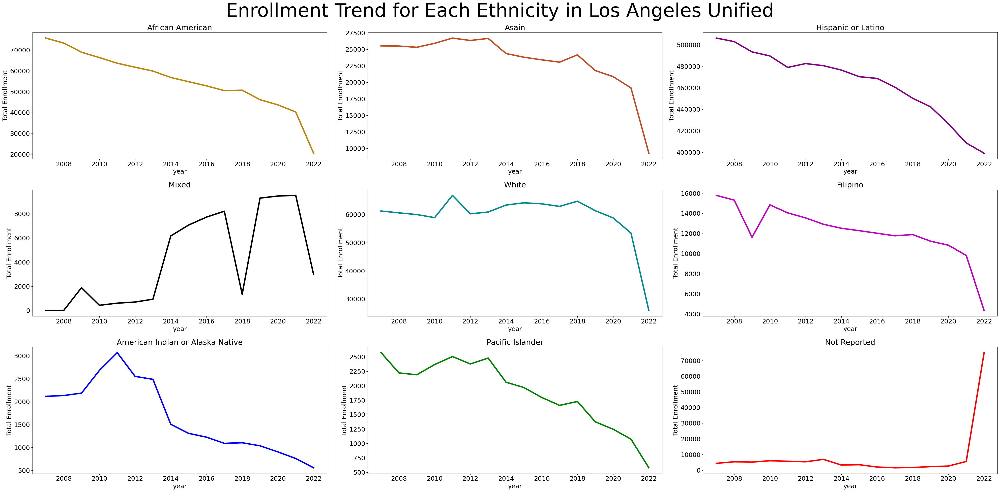

In [825]:
#it seems that the total enrollment for each ethnicty has been dropping except for 'Not Reported'
ethnicity_trend(LA_district,facet=True)

#### Predicting Future Total Enrollment for LA


'The projection of total enrollment for Los Angeles Unified in 2050 is to be 521911. Which is -16384 more students than 2023'

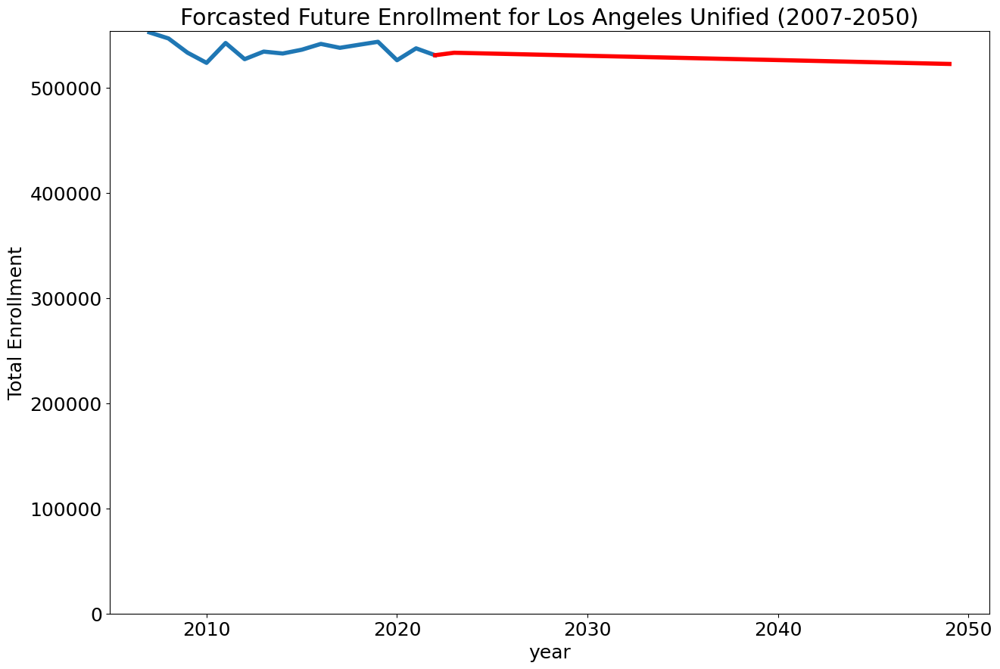

In [826]:
#it seems that LA schools could be seeing a decrease in enrollment in the next 20 years
forecast_future_enrol(LA_district,2050)

['Predicted enrollment for Granada Hills Charter in 2050: 15375',
 'Predicted enrollment for El Camino Real Charter High in 2050: 11745',
 'The disparity in enrollment between Granada Hills Charter and El Camino Real Charter High is 3630, indicating that Granada Hills Charter is projected to have more students than El Camino Real Charter High in 2050.']

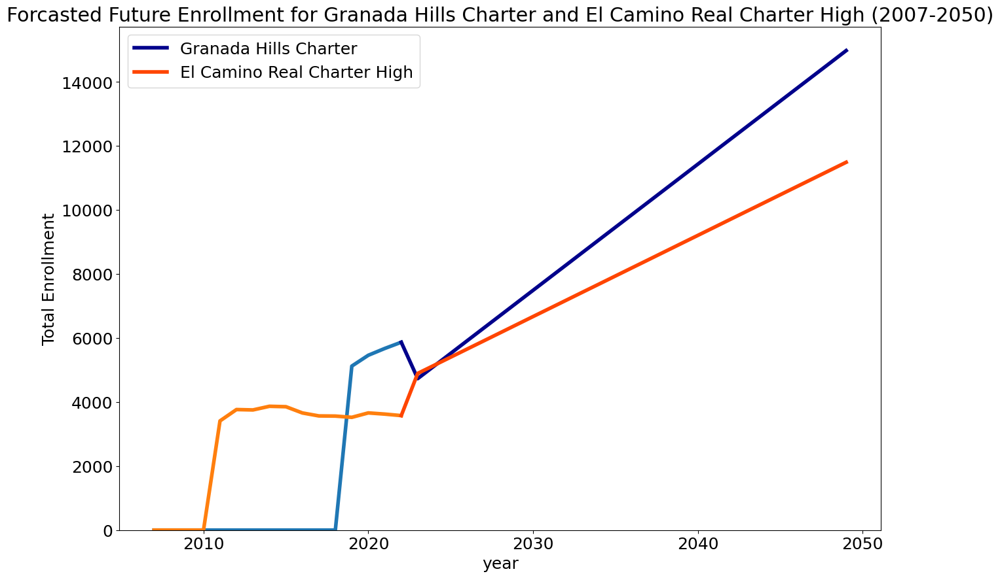

In [827]:
forecast_two_future_enrol('Granada Hills Charter','El Camino Real Charter High',2050,is_district=False)

# Personal Reflection
- I learned an approach for dealing with Null values or absent data using:
    - `fillna`
    - conditionals
    - assigning a numerical Null value as zero in the context of performing arithmetic

- I discovered how to write more efficient code using:
    - conditional statements
    - optional parameters
    - data structures comprehension

- I found out more about how to make comprehensive and interpretable plots using:
    - colors 
    - facets and how to label each of them
    - inducing the grammar of graphics

- I gained a deeper understanding of the concept of 'scope' within conditionals, functions, and loops.
- I improved my comprehension skills, specifically for list and dictionary comprehensions.
- I became able to think as the audience or user of these functions when it came to writing the code and thinking of its output.
- Being able to automate outputs with categorical data. That is with functions and the educational institutions as the categorical variables.